#<font color='lightgreen'>💧 **AGUAS SUBTERRANEAS - LAMBAYEQUE** 💧 </font>

---

## <font color='orange'>🟠 **Problema de Negocio: Gestión Sostenible de Cuencas y Pozos Acuíferos en Lambayeque** </font>
Para el departamento de Lambayeque en gran crecimiento que depende en gran medida de las aguas subterráneas para satisfacer las necesidades de agua potable. Sin embargo, debido al aumento de la población y la expansión urbana, la sobreexplotación de los recursos hídricos subterráneos se ha convertido en un problema crítico. Esto ha llevado a la disminución del nivel freático, la intrusión salina en acuíferos y la degradación de la calidad del agua.

El desafío radica en encontrar soluciones para garantizar una gestión sostenible de las aguas subterráneas, equilibrando la demanda creciente con la necesidad de conservar y proteger este recurso vital.

## <font color='orange'>🟠 **Datos** </font>

 **Los datos están en formato xlsx en donde cada línea representa un atributo:**
  - `CLAVE`: Identificador único para una ubicación o muestra específica.
  - `SITIO`: Indica el lugar donde se recogió la muestra.
  - `ORGANISMO_DE_CUENCA`: Se refiere a la organización de la cuenca asociada al sitio.
  - `ESTADO`: Indica el estado en el que se encuentra el sitio.
  - `MUNICIPIO`: Especifica el municipio de la ubicación del sitio.
  - `ACUIFERO`: Se refiere al acuífero asociado o cercano al sitio.
  - `SUBTIPO`: Proporciona información adicional de clasificación o subtipo sobre el tipo de agua subterranea donde se recogio la muestra.
  - `LONGITUD/LATITUD`: Coordenadas geográficas que especifican la ubicación exacta del sitio/muestra.
  - `PH`: Mide la acidez/alcalinidad del agua en una escala de 0-14, donde 7 es neutro, <7 ácido, >7 alcalino.
  - `Hardness`: Se mide en miligramos por litro (mg/L), que indica la concentración de iones de calcio y magnesio en el agua.
  - `Solids`: Se mide en miligramos por litro (mg/L) y representa la cantidad total de partículas disueltas en el agua, incluyendo minerales, sales, metales, etc.
  - `Sulfate`: Se mide en miligramos por litro (mg/L) es un anión común en el agua que puede influir en su sabor y puede tener efectos adversos en la salud humana en concentraciones elevadas.
  - `Conductivity`: Se mide en microsiemens por centímetro (µS/cm) y representa la capacidad del agua para conducir la corriente eléctrica.
  - `Organic_carbon`: Se mide en miligramos por litro (mg/L) y refleja la cantidad de carbono orgánico presente en el agua.
  - `Trihalomethanes`: Se mide en microgramos por litro (µg/L) y representa la concentración de trihalometanos en el agua.
  - `Turbidity`: Mide la turbidez o claridad del agua en unidades de nefelometría turbia (NTU).
  - `Potability`: Indica si el agua es potable o no (1: potable, 0: no potable).

Los datos que te ha enviado la compañía están en el archivo `Aguas-Subterraneas.xlsx`.

## <font color='orange'>🟠 **1. Configuración del Ambiente** </font>

In [ ]:
pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 9.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 18.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=cdd23c167d226f907c98e3c190687e6f543030a3f460982be60a20430b2ea178
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


In [135]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import warnings
import missingno as msno
from statsmodels.stats.outliers_influence import variance_inflation_factor
from ydata_profiling import ProfileReport
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
pd.set_option('display.max_columns', None)
warnings.filterwarnings("ignore")
global df_aguaSub, df_aguaSub_limpio

### <font color='white'>⚪ **1.1.- Versiones de Librerias** </font>

In [137]:
!python -V
print('------')
!pip show pandas | grep 'Name\|Version'
print('------')
!pip show numpy | grep 'Name\|Version'
print('------')
!pip show Matplotlib | grep 'Name\|Version'

Python 3.10.12
------
Name: pandas
Version: 1.5.3
------
Name: numpy
Version: 1.25.2
------
Name: matplotlib
Version: 3.7.1


## <font color='orange'>🟠 **2. Obtención, Tratamiento y Análisis Exploratorio (EDA)** </font>


### <font color='white'>⚪ **2.1.- Cargando Base de Datos** </font>

In [149]:
from google.colab import drive
drive.mount('/content/drive')
df_aguaSub=pd.read_excel('/content/drive/MyDrive/PA-INTELIGENCIA ARTIFICIAL/Copia4 de Aguas-Subterraneas-1.xlsx')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [150]:
df_aguaSub.head()

,CLAVE,SITIO,ORGANISMO_DE_CUENCA,ESTADO,MUNICIPIO,ACUIFERO,SUBTIPO,LONGITUD,LATITUD,ph,Hardness,Solids,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,DLGUA6090,MUNICIPIO DE JERECUARO 13,LERMA SANTIAGO PACÍFICO,GUANAJUATO,JERECUARO,VALLE DE LA CUEVITA,POZO,-100.49086,20.21091,9.792728,161.057881,30249.17080,258.038852,413.155466,12.493388,76.225580,3.729120,1
1,OCNOR4223,POZO REYNOSO,NOROESTE,SONORA,GENERAL PLUTARCO ELÍAS CALLES,SONOYTA-PUERTO PEÑASCO,POZO,-112.60160,31.69080,4.959853,215.854869,9887.83075,379.504731,527.479694,14.326638,52.388849,3.455045,1
2,DLZAC2612,POZO 1401 GRANJA MARIA TERESA,CUENCAS CENTRALES DEL NORTE,ZACATECAS,ZACATECAS,BENITO JUAREZ,POZO,-102.71925,22.67801,6.832217,164.274393,14015.04480,281.678040,389.978097,14.836637,44.367574,3.145416,0
3,DLDUR655,POZO 2 TEPEHUANES,CUENCAS CENTRALES DEL NORTE,DURANGO,TEPEHUANES,TEPEHUANES-SANTIAGO,POZO,-105.71853,25.33097,7.333478,233.721355,16066.55210,224.212503,401.739309,15.313978,81.842062,4.772663,1
4,DLGUA1059,EJIDO PUERTA DE SAN GERMAN (NICASIO BECERRA),LERMA SANTIAGO PACÍFICO,GUANAJUATO,LEÓN,VALLE DE LEON,POZO,-101.77142,21.04601,7.027186,185.320701,30988.97300,327.462670,326.269080,9.982010,52.716589,5.353043,0


In [ ]:
df_aguaSub.shape

(2368, 18)

In [ ]:
df_aguaSub.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2368 entries, 0 to 2367
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CLAVE                2368 non-null   object 
 1   SITIO                2367 non-null   object 
 2   ORGANISMO_DE_CUENCA  2368 non-null   object 
 3   ESTADO               2368 non-null   object 
 4   MUNICIPIO            2368 non-null   object 
 5   ACUIFERO             2367 non-null   object 
 6   SUBTIPO              2368 non-null   object 
 7   LONGITUD             2368 non-null   float64
 8   LATITUD              2368 non-null   float64
 9   ph                   2302 non-null   float64
 10  Hardness             2368 non-null   float64
 11  Solids               2368 non-null   float64
 12  Sulfate              2282 non-null   float64
 13  Conductivity         2368 non-null   float64
 14  Organic_carbon       2368 non-null   float64
 15  Trihalomethanes      2349 non-null   f

> * **

**Dimensiones:** El DataFrame tiene 2368 filas y 18 columnas.

**Valores faltantes:**
* La columna ph tiene 66 valores faltantes.
* La columna Sulfate tiene 86 valores faltantes.
* La columna Trihalomethanes tiene 19 valores faltantes.
* Las columnas SITIO y ACUIFERO tienen 1 valor faltante cada una.

**Tipos de datos:**
* Hay 10 columnas de tipo float64, que probablemente representan medidas físicas o químicas del agua.
* Hay 7 columnas de tipo object, que podrían ser variables categóricas como nombres de lugares o identificadores.

**Potabilidad del agua:**
* La columna Potability es de tipo int64 y parece ser una variable binaria que indica si el agua es potable (1) o no potable (0).

**Estadísticas básicas:**
* Las columnas LONGITUD y LATITUD representan las coordenadas geográficas y tienen valores dentro de rangos razonables.
* Las columnas que representan medidas físicas o químicas del agua, como ph, Hardness, Solids, Sulfate, Conductivity, Organic_carbon, Trihalomethanes, y Turbidity, tienen diferentes rangos y distribuciones que podrían necesitar análisis más detallado dependiendo del objetivo del estudio.

**Posible preprocesamiento:**

* Es posible que se requiera un preprocesamiento adicional, como manejo de valores faltantes y codificación de variables categóricas, dependiendo de los análisis o modelos que se deseen realizar con estos datos.

>* **

In [138]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df_aguaSub, title='Aguas Subterraneas - Análisis', explorative=True)
profile.to_file("AguasSub-report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### <font color='white'>⚪ **2.2.- Tratamiento y Análisis Exploratorio de Datos** </font>

In [151]:
#Verificar y eliminar duplicados
cantidad_duplicados_por_columna = df_aguaSub[df_aguaSub.duplicated()].sum()
cantidad_duplicados_por_columna

CLAVE                  0.0
SITIO                  0.0
ORGANISMO_DE_CUENCA    0.0
ESTADO                 0.0
MUNICIPIO              0.0
ACUIFERO               0.0
SUBTIPO                0.0
LONGITUD               0.0
LATITUD                0.0
ph                     0.0
Hardness               0.0
Solids                 0.0
Sulfate                0.0
Conductivity           0.0
Organic_carbon         0.0
Trihalomethanes        0.0
Turbidity              0.0
Potability             0.0
dtype: float64

In [152]:
#Ver los valores nulos
df_aguaSub.isna().sum().sort_values(ascending = False)

Sulfate                86
ph                     66
Trihalomethanes        19
ACUIFERO                1
SITIO                   1
Hardness                0
Turbidity               0
Organic_carbon          0
Conductivity            0
Solids                  0
CLAVE                   0
LATITUD                 0
LONGITUD                0
SUBTIPO                 0
MUNICIPIO               0
ESTADO                  0
ORGANISMO_DE_CUENCA     0
Potability              0
dtype: int64

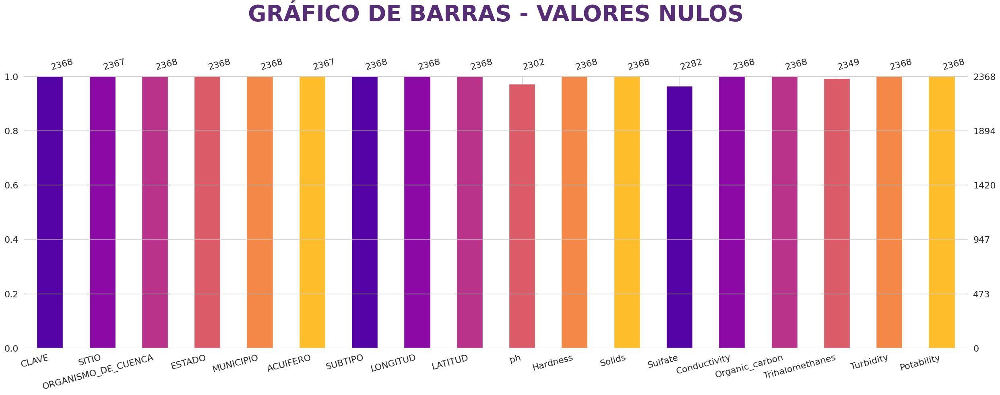

In [139]:
## Mostrando visualmente la cantidad de nulos para cada variable, con respecto al total de datos
msno.bar(df_aguaSub, color=sns.color_palette("plasma"),label_rotation=15)
plt.title('GRÁFICO DE BARRAS - VALORES NULOS', fontdict={'fontsize': 40, 'fontweight': 'bold', 'color': '#552E75'}, pad=100)
plt.tight_layout()
plt.show()

> * **
> * **En el conjunto de datos, algunas variables como el pH, sulfate y los trihalometanos tienen muchos valores faltantes. Es importante decidir cómo manejar estos valores. Puedes reemplazar los valores faltantes por la media de la variable, eliminar las observaciones con valores faltantes o asignar un valor predeterminado, como 0. La elección de la estrategia dependerá del análisis específico y sus posibles efectos en los resultados.**
> * **Con respecto a las variables categoricas tenemos un valor nulo de Acuifero y Sitio**
> * **

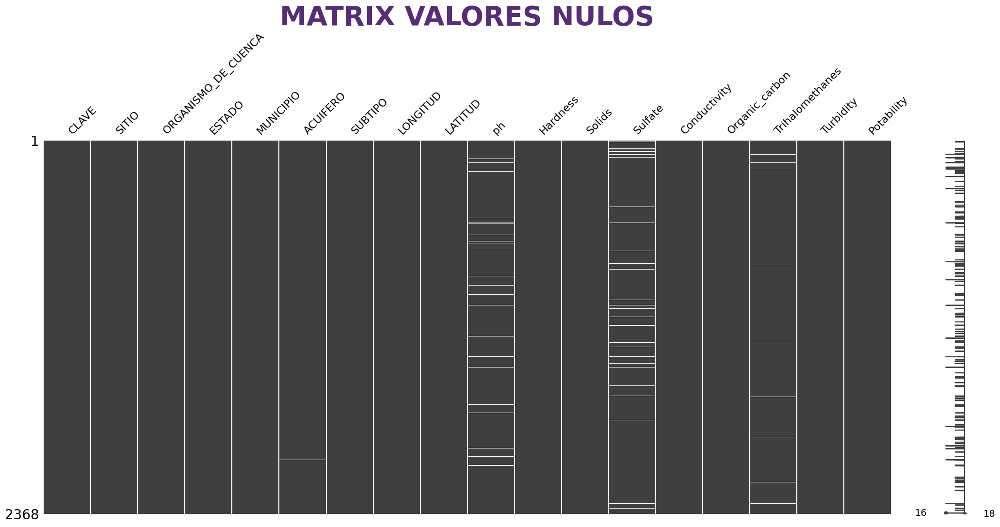

In [ ]:
## Se realiza una gráfica de matriz de nulos
msno.matrix(df_aguaSub)
plt.title('MATRIX VALORES NULOS',fontdict={'fontsize': 40, 'fontweight': 'bold', 'color': '#552E75'})
plt.tight_layout()
plt.show()

> * **
> * **Se observa bastante presencia de datos nulos en 4 variables.**
> * **Las variables ph, sulfate y thihametanos, notamos que existen datos nulos en casi las mismas posiciones.**
> * **Se evalua la posibilidad de poder eliminar esos valores nulos o de lo contrario como hay muchos y pueda afectar a nuestro dataset reemplazarlo por su media.**
> * **

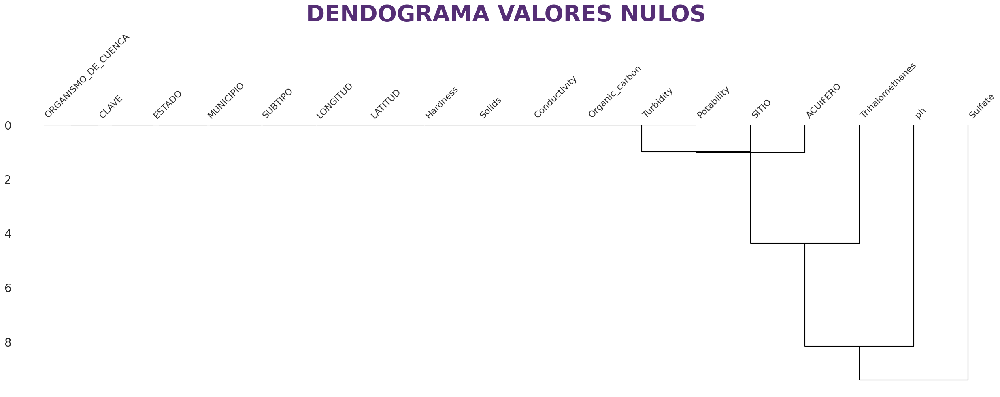

In [142]:
## Se realiza la gráfica de dendograma para valores nulos
msno.dendrogram(df_aguaSub)
plt.title('DENDOGRAMA VALORES NULOS', fontdict={'fontsize': 40, 'fontweight': 'bold', 'color': '#552E75'},pad=20)
plt.tight_layout()
plt.show()

> * **
> * **Notamos la fuerte correlación en el dendograma entre las variables 'Sitio' y 'trihalomethanes' a la vez estás variables tienen correlación con la variable ph y poteriormete con el sulfate**
> * **De todas maneras, tener en cuenta que estas variables son bastantes en su mayoria de cantidad y no presenta mucha coincidencia entre las filas entonces eliminarlas seria mala opción, ya que quitariamos mucha información en nuestra dataset, entonces procedemos a imputarlo por su media**
> * **

In [153]:
#Eliminar Duplicados
df_aguaSub_limpio=df_aguaSub.drop_duplicates()

In [154]:
df_aguaSub_limpio.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2368 entries, 0 to 2367
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CLAVE                2368 non-null   object 
 1   SITIO                2367 non-null   object 
 2   ORGANISMO_DE_CUENCA  2368 non-null   object 
 3   ESTADO               2368 non-null   object 
 4   MUNICIPIO            2368 non-null   object 
 5   ACUIFERO             2367 non-null   object 
 6   SUBTIPO              2368 non-null   object 
 7   LONGITUD             2368 non-null   float64
 8   LATITUD              2368 non-null   float64
 9   ph                   2302 non-null   float64
 10  Hardness             2368 non-null   float64
 11  Solids               2368 non-null   float64
 12  Sulfate              2282 non-null   float64
 13  Conductivity         2368 non-null   float64
 14  Organic_carbon       2368 non-null   float64
 15  Trihalomethanes      2349 non-null   f

> * **Observamos que tenemos 18 columnas y 2368 filas**


In [155]:
df_aguaSub_limpio.columns

Index(['CLAVE', 'SITIO', 'ORGANISMO_DE_CUENCA', 'ESTADO', 'MUNICIPIO',
       'ACUIFERO', 'SUBTIPO', 'LONGITUD', 'LATITUD', 'ph', 'Hardness',
       'Solids', 'Sulfate', 'Conductivity', 'Organic_carbon',
       'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [156]:
#Separamos los atributos más importantes
df_aguaSub_limpio=df_aguaSub_limpio[['ORGANISMO_DE_CUENCA','SUBTIPO','ph', 'Hardness',
       'Solids', 'Conductivity', 'Organic_carbon','Sulfate',
       'Trihalomethanes', 'Turbidity', 'Potability']]

> * **
> * **La variable principal, municipio, acuífero y sitio nos proporciona en el informe un análisis de sentimiento, por lo tanto, estas columnas contienen información subjetiva o no estructurada.**
> * **En las variables numéricas excluimos la longitud y latitud, ya que para nuestro propósito, que es la calidad del agua, la ubicación no es relevante.**
> * **La variable estado tiene 33 valores únicos, pero no la consideramos debido a que, como mencionamos anteriormente, no nos enfocamos en la ubicación de la cuenca, sino en la calidad del agua.**
> * **La variable subtipo y organismo cuenca serán tenidas en cuenta, ya que una organización puede influir significativamente en la calidad del agua, por ejemplo, en su filtración, si es buena o mala, así como en sus acciones y políticas relacionadas con la agricultura, la industria, la gestión de residuos y la regulación ambiental.
En cuanto a la variable subtipo, está desequilibrada, por lo que la consideraremos al principio, pero podría no ser muy relevante y, por lo tanto, descartarla.**
> * **

In [157]:
#Traducimos las variables al español para una mejor comprensión
df_aguaSub_limpio.rename(columns={
    'ORGANISMO_DE_CUENCA':'orgCuen',
    'SUBTIPO':'subtipo',
    'ph':'ph',
    'Hardness':'dureza',
    'Solids':'soliToDis',
    'Sulfate':'sulfato',
    'Conductivity':'conductividad',
    'Organic_carbon':'carbono_O',
    'Trihalomethanes':'trihalometanos',
    'Turbidity':'turbidez',
    'Potability':'Potabilidad'
},inplace=True)

> * **
> * **Imputamos los valores faltantes con la media en la variable PH**

**DATOS IMPORTANTE PARA EL PH :**

> * **Si bien el pH y la dureza del agua son dos propiedades distintas, pueden influirse entre sí indirectamente. Por ejemplo, el pH del agua puede afectar la solubilidad de los minerales presentes en ella, lo que a su vez puede influir en su dureza. Además, la dureza del agua puede influir en su capacidad para neutralizar ácidos o bases, lo que puede afectar su pH.**
> * **

> * **
**Dureza:**

> * **Blanda: Menos de 60 mg/L de carbonato de calcio (CaCO3).**

Se considera que el agua blanda es adecuada para la mayoría de los usos, incluido el consumo humano y el uso doméstico. Tiende a ser más suave para la piel y el cabello, y es menos probable que deje depósitos de cal en tuberías y electrodomésticos.

> * **Moderadamente dura: De 61 a 120 mg/L de CaCO3.**

Aunque ligeramente más dura que el agua blanda, el agua moderadamente dura sigue siendo adecuada para la mayoría de los usos domésticos. Puede requerir algún tratamiento adicional para reducir la formación de depósitos de cal.


> * **Dura: De 121 a 180 mg/L de CaCO3.**

El agua dura puede causar problemas de acumulación de cal en tuberías, grifos y electrodomésticos con el tiempo. Aunque todavía es segura para el consumo humano, puede ser necesaria una mayor atención para minimizar los efectos de la dureza.

> * **Muy dura: Más de 180 mg/L de CaCO3.**

El agua muy dura puede causar problemas significativos de acumulación de cal y reducir la eficiencia de los electrodomésticos como calentadores de agua y lavadoras. Puede requerir un tratamiento más intensivo para suavizarla antes de su uso.
> * **

In [158]:
#Rellenamos los valores nulos con la media
mediaPh1 = df_aguaSub_limpio[(df_aguaSub_limpio['Potabilidad'] == 0) & (df_aguaSub_limpio['dureza'] <= 120)][['ph']].mean()
mediaPh2 = df_aguaSub_limpio[(df_aguaSub_limpio['Potabilidad'] == 0) & (df_aguaSub_limpio['dureza'] > 120)][['ph']].mean()
mediaPh3 = df_aguaSub_limpio[(df_aguaSub_limpio['Potabilidad'] == 1) & (df_aguaSub_limpio['dureza'] <= 120)][['ph']].mean()
mediaPh4 = df_aguaSub_limpio[(df_aguaSub_limpio['Potabilidad'] == 1) & (df_aguaSub_limpio['dureza'] > 120)][['ph']].mean()

print("VALOR DE PH: {:.2f}".format(float(mediaPh1)))
print("VALOR DE PH: {:.2f}".format(float(mediaPh2)))
print("VALOR DE PH: {:.2f}".format(float(mediaPh3)))
print("VALOR DE PH: {:.2f}".format(float(mediaPh4)))


VALOR DE PH: 7.28
VALOR DE PH: 7.08
VALOR DE PH: 7.73
VALOR DE PH: 7.09


In [159]:
for x in range(0, len(df_aguaSub_limpio)):
    if (pd.isnull(df_aguaSub_limpio['ph'][x]) == True):
        if ((df_aguaSub_limpio['Potabilidad'][x] == 0) & (df_aguaSub_limpio['dureza'][x] <= 120)):
            df_aguaSub_limpio['ph'][x] = mediaPh1
        elif ((df_aguaSub_limpio['Potabilidad'][x] == 0) & (df_aguaSub_limpio['dureza'][x] > 120)):
            df_aguaSub_limpio['ph'][x] = mediaPh2
        elif ((df_aguaSub_limpio['Potabilidad'][x] == 1) & (df_aguaSub_limpio['dureza'][x] <= 120)):
            df_aguaSub_limpio['ph'][x] = mediaPh3
        elif ((df_aguaSub_limpio['Potabilidad'][x] == 1) & (df_aguaSub_limpio['dureza'][x] > 120)):
            df_aguaSub_limpio['ph'][x] = mediaPh4

> * **Valores Faltantes de trihalometanos**

In [160]:
mediaTri1 = df_aguaSub_limpio[(df_aguaSub_limpio['Potabilidad'] == 0)][['trihalometanos']].mean()
mediaTri2 = df_aguaSub_limpio[(df_aguaSub_limpio['Potabilidad'] == 1)][['trihalometanos']].mean()
print("trihalometanos : {:.2f}".format(float(mediaPh1)))
print("trihalometanos : {:.2f}".format(float(mediaPh2)))

trihalometanos : 7.28
trihalometanos : 7.08


In [161]:
for x in range(0, len(df_aguaSub_limpio)):
    if (pd.isnull(df_aguaSub_limpio['trihalometanos'][x]) == True):
        if ((df_aguaSub_limpio['Potabilidad'][x] == 0)):
            df_aguaSub_limpio['trihalometanos'][x] = mediaTri1
        elif ((df_aguaSub_limpio['Potabilidad'][x] == 1)):
            df_aguaSub_limpio['trihalometanos'][x] = mediaTri2

> * **Valores Faltantes de Sulfato**

In [162]:
mediaSul1 = df_aguaSub_limpio[(df_aguaSub_limpio['Potabilidad'] == 0)][['sulfato']].mean()
mediaSul2 = df_aguaSub_limpio[(df_aguaSub_limpio['Potabilidad'] == 1)][['sulfato']].mean()
print("sulfato : {:.2f}".format(float(mediaSul1)))
print("sulfato : {:.2f}".format(float(mediaSul2)))

sulfato : 333.71
sulfato : 331.91


In [163]:
for x in range(0, len(df_aguaSub_limpio)):
    if (pd.isnull(df_aguaSub_limpio['sulfato'][x]) == True):
        if ((df_aguaSub_limpio['Potabilidad'][x] == 0)):
            df_aguaSub_limpio['sulfato'][x] = mediaSul1
        elif ((df_aguaSub_limpio['Potabilidad'][x] == 1)):
            df_aguaSub_limpio['sulfato'][x] = mediaSul2

>* **Se ha realizado una imputación de la media para los valores faltantes, especialmente en la variable 'Sulfate', que tiene 84 datos faltantes. Esta cantidad de valores faltantes representa aproximadamente el 3.54% del DataFrame original de 2368 filas, por lo que no afectaría significativamente al conjunto de datos original.**

In [164]:
df_aguaSub_limpio.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2368 entries, 0 to 2367
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   orgCuen         2368 non-null   object 
 1   subtipo         2368 non-null   object 
 2   ph              2368 non-null   float64
 3   dureza          2368 non-null   float64
 4   soliToDis       2368 non-null   float64
 5   conductividad   2368 non-null   float64
 6   carbono_O       2368 non-null   float64
 7   sulfato         2368 non-null   float64
 8   trihalometanos  2368 non-null   float64
 9   turbidez        2368 non-null   float64
 10  Potabilidad     2368 non-null   int64  
dtypes: float64(8), int64(1), object(2)
memory usage: 286.5+ KB


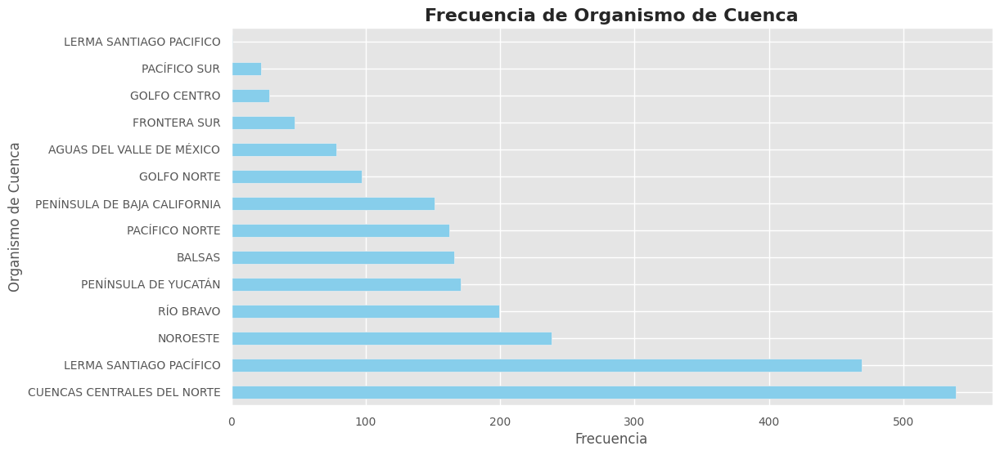

In [165]:
# Estilo del gráfico
plt.style.use('ggplot')

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
df_aguaSub_limpio['orgCuen'].value_counts().sort_values().plot(kind='barh', color='skyblue')
plt.title('Frecuencia de Organismo de Cuenca', fontsize=16, fontweight='bold')
plt.xlabel('Frecuencia', fontsize=12)
plt.ylabel('Organismo de Cuenca', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.gca().invert_yaxis()
plt.show()

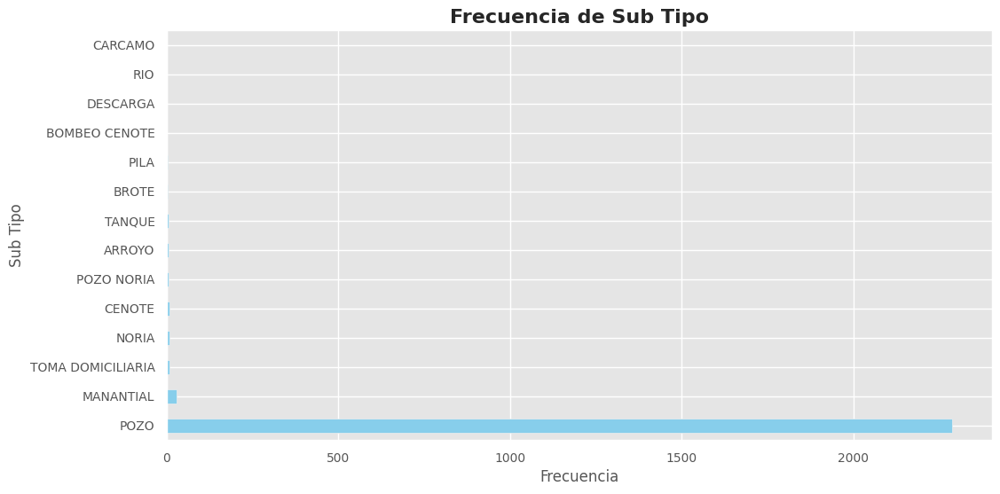

In [167]:
# Estilo del gráfico
plt.style.use('ggplot')

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
df_aguaSub_limpio['subtipo'].value_counts().sort_values().plot(kind='barh', color='skyblue')
plt.title('Frecuencia de Sub Tipo', fontsize=16, fontweight='bold')
plt.xlabel('Frecuencia', fontsize=12)
plt.ylabel('Sub Tipo', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.gca().invert_yaxis()
plt.show()

> * **La variable 'SUBTIPO' muestra un desbalance considerable, ya que la mayoría de las entradas están clasificadas como 'pozo'. Esto indica que casi todas las aguas subterráneas son del tipo 'pozo'.**

In [168]:
def estadisticos_cont(num):
    #Calculamos describe
    estadisticos = num.describe().T
    #Añadimos la mediana
    estadisticos['median'] = num.median()
    #Reordenamos para que la mediana esté al lado de la media
    estadisticos = estadisticos.iloc[:,[0,1,8,2,3,4,5,6,7]]
    #Lo devolvemos
    return(estadisticos)

In [169]:
estadisticos_cont(df_aguaSub_limpio.select_dtypes('number'))

,count,mean,median,std,min,25%,50%,75%,max
ph,2368.0,7.087112,7.075428,1.536346,0.227499,6.124804,7.075428,7.989376,14.000000
dureza,2368.0,195.734264,196.824477,32.334618,73.492234,176.789851,196.824477,216.117775,317.338124
soliToDis,2368.0,22017.819219,21041.034750,8577.073549,320.942611,15852.864335,21041.034750,27231.111975,56488.672400
conductividad,2368.0,426.239386,422.452269,81.079953,201.619737,365.228259,422.452269,482.487877,753.342620
carbono_O,2368.0,14.343020,14.287907,3.304900,2.200000,12.130794,14.287907,16.615199,27.006707
sulfato,2368.0,332.888586,331.908065,41.147465,129.000000,307.606960,331.908065,358.333077,481.030642
trihalometanos,2368.0,66.387885,66.402994,16.135431,8.577013,55.811222,66.402994,77.267739,124.000000
turbidez,2368.0,3.968832,3.959406,0.777670,1.450000,3.442666,3.959406,4.511555,6.494749
Potabilidad,2368.0,0.456081,0.000000,0.498173,0.000000,0.000000,0.000000,1.000000,1.000000


> * **

**ph:**
La media del pH es de aproximadamente 7.09, con una desviación estándar de 1.54.
Los valores varían desde 0.23 hasta 14.00, con la mayoría de los valores entre 6.12 y 7.99.

**Dureza:**
La media de la dureza es de aproximadamente 195.73, con una desviación estándar de 32.33.
Los valores van desde 73.49 hasta 317.34, con la mayoría entre 176.79 y 216.12.

**Sólidos Totales Disueltos:**
La media de los sólidos totales disueltos es de aproximadamente 22017.82, con una desviación estándar de 8577.07.
Los valores van desde 320.94 hasta 56488.67, con la mayoría entre 15852.86 y 27231.11.

**Conductividad:**
La media de la conductividad es de aproximadamente 426.24, con una desviación estándar de 81.08.
Los valores van desde 201.62 hasta 753.34, con la mayoría entre 365.23 y 482.49.

**Carbono Orgánico:**
La media del carbono orgánico es de aproximadamente 14.34, con una desviación estándar de 3.30.
Los valores varían desde 2.20 hasta 27.01, con la mayoría entre 12.13 y 16.62.

**Sulfato:**
La media del sulfato es de aproximadamente 332.89, con una desviación estándar de 41.15.
Los valores van desde 129.00 hasta 481.03, con la mayoría entre 307.61 y 358.33.

**Trihalometanos:**
La media de los trihalometanos es de aproximadamente 66.39, con una desviación estándar de 16.14.
Los valores van desde 8.58 hasta 124.00, con la mayoría entre 55.81 y 77.27.

**Turbidez:**
La media de la turbidez es de aproximadamente 3.97, con una desviación estándar de 0.78.
Los valores van desde 1.45 hasta 6.49, con la mayoría entre 3.44 y 4.51.

**Potabilidad:**
La proporción media de potabilidad es de aproximadamente 0.46, con una desviación estándar de 0.50.
Hay un desbalanceo en los datos, ya que la mayoría de los valores son 0 (no potable).
> * **
> * **La variable 'Solids' (Sólidos Totales Disueltos) tiene un promedio y una desviación estándar altos en comparación con otras características. Esto sugiere que la distribución de esta variable puede tener una mayor dispersión de datos y variabilidad en comparación con las demás.**
> * **

In [170]:
df_aguaSub_limpio['subtipo'].unique()

array(['POZO', 'PILA', 'MANANTIAL', 'NORIA', 'CARCAMO', 'TANQUE',
       'TOMA DOMICILIARIA', 'RIO', 'ARROYO', 'CENOTE', 'POZO NORIA',
       'BROTE', 'DESCARGA', 'BOMBEO CENOTE'], dtype=object)

In [171]:
def procesar_datos_cat():
  global df_aguaSub_limpio
  a = {'POZO': 1,
        'NORIA': 2,
        'MANANTIAL': 3,
        'ARROYO': 4,
        'RIO': 5,
        'PILA': 6,
        'TOMA DOMICILIARIA': 7,
        'TANQUE': 8,
        'POZO NORIA': 9,
        'CENOTE': 10,
        'BOMBEO CENOTE': 11,
       'BROTE':12,
       'CARCAMO':13,
       'DESCARGA':14
        }
  df_aguaSub_limpio['subtipo'] = df_aguaSub_limpio['subtipo'].map(a).astype(int)

  b = {'CUENCAS CENTRALES DEL NORTE': 1,
        'LERMA SANTIAGO PACÍFICO': 2,
        'PENÍNSULA DE BAJA CALIFORNIA': 3,
        'PENÍNSULA DE YUCATÁN': 4,
        'RÍO BRAVO': 5,
        'PACÍFICO NORTE': 6,
        'BALSAS': 7,
        'AGUAS DEL VALLE DE MÉXICO': 8,
        'GOLFO NORTE': 9,
        'PACÍFICO SUR': 10,
        'GOLFO CENTRO': 11,
        'FRONTERA SUR': 12,
        'NOROESTE': 13,
       'LERMA SANTIAGO PACIFICO':14}

  df_aguaSub_limpio['orgCuen'] = df_aguaSub_limpio['orgCuen'].map(b).astype(int)

In [172]:
procesar_datos_cat()

In [173]:
df_aguaSub_limpio.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2368 entries, 0 to 2367
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   orgCuen         2368 non-null   int64  
 1   subtipo         2368 non-null   int64  
 2   ph              2368 non-null   float64
 3   dureza          2368 non-null   float64
 4   soliToDis       2368 non-null   float64
 5   conductividad   2368 non-null   float64
 6   carbono_O       2368 non-null   float64
 7   sulfato         2368 non-null   float64
 8   trihalometanos  2368 non-null   float64
 9   turbidez        2368 non-null   float64
 10  Potabilidad     2368 non-null   int64  
dtypes: float64(8), int64(3)
memory usage: 286.5 KB


In [174]:
df_aguaSub_limpio

,orgCuen,subtipo,ph,dureza,soliToDis,conductividad,carbono_O,sulfato,trihalometanos,turbidez,Potabilidad
0,2,1,9.792728,161.057881,30249.17080,413.155466,12.493388,258.038852,76.225580,3.729120,1
1,13,1,4.959853,215.854869,9887.83075,527.479694,14.326638,379.504731,52.388849,3.455045,1
2,1,1,6.832217,164.274393,14015.04480,389.978097,14.836637,281.678040,44.367574,3.145416,0
3,1,1,7.333478,233.721355,16066.55210,401.739309,15.313978,224.212503,81.842062,4.772663,1
4,2,1,7.027186,185.320701,30988.97300,326.269080,9.982010,327.462670,52.716589,5.353043,0
...,...,...,...,...,...,...,...,...,...,...,...
2363,2,1,7.262535,212.521308,38713.11270,332.425224,14.098786,262.095022,70.300741,4.846359,0
2364,2,1,5.492156,176.271404,26422.09790,500.938788,7.609798,366.644766,59.396787,3.294129,0
2365,7,1,6.903817,258.526842,35455.70960,318.622622,13.961740,206.247229,65.866679,3.867843,1
2366,6,1,8.892998,224.078183,22960.18060,466.245480,9.693049,274.689459,59.577212,3.619133,1


###<font color='white'>⚪ 2.3.- Análisis Univariado de la Variable Target

> * **
Realizamos un análisis inicial de la Variable target ('Potabilidad'), esto con la finalidad de observar la distribución de este valor en nuestro dataframe. Se realizan dos gráficos, el de barras y el de torta. Este último para observar los porcentajes.
> * **

In [ ]:
target = 'Potabilidad'

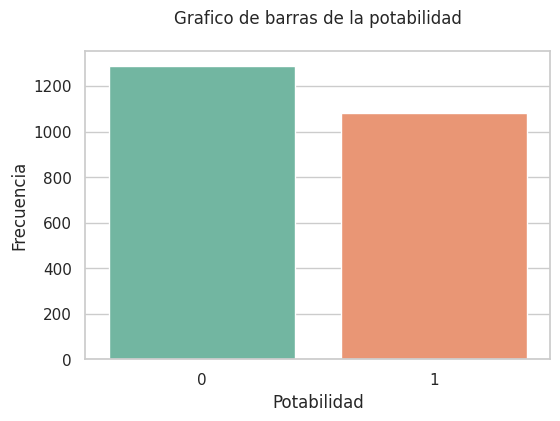

In [ ]:
# Gráfico de barras
plt.figure(figsize=(6, 4))
sns.set(style="whitegrid")
sns.countplot(x=target, data=df_aguaSub_limpio, palette="Set2")
plt.title('Grafico de barras de la potabilidad', pad=20)
plt.xlabel(target)
plt.ylabel('Frecuencia')
plt.show()

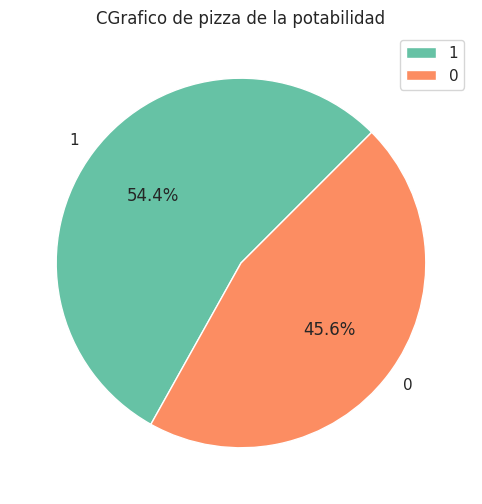

In [ ]:
## Grafica de pie
valores = df_aguaSub_limpio[target].value_counts()
etiqueta = df_aguaSub_limpio[target].unique()
plt.figure(figsize=(9,6))
plt.pie(valores,labels=etiqueta,autopct="%1.1f%%", colors= ['#66c2a5', '#fc8d62'], startangle=45)
plt.legend(loc='best')
plt.title('CGrafico de pizza de la potabilidad')
plt.show()

> * **Se ha observado que la variable 'Potabilidad' está desbalanceada y se trabajará primero con los datos desbalanceados para ser más realistas con el conjunto de datos.**

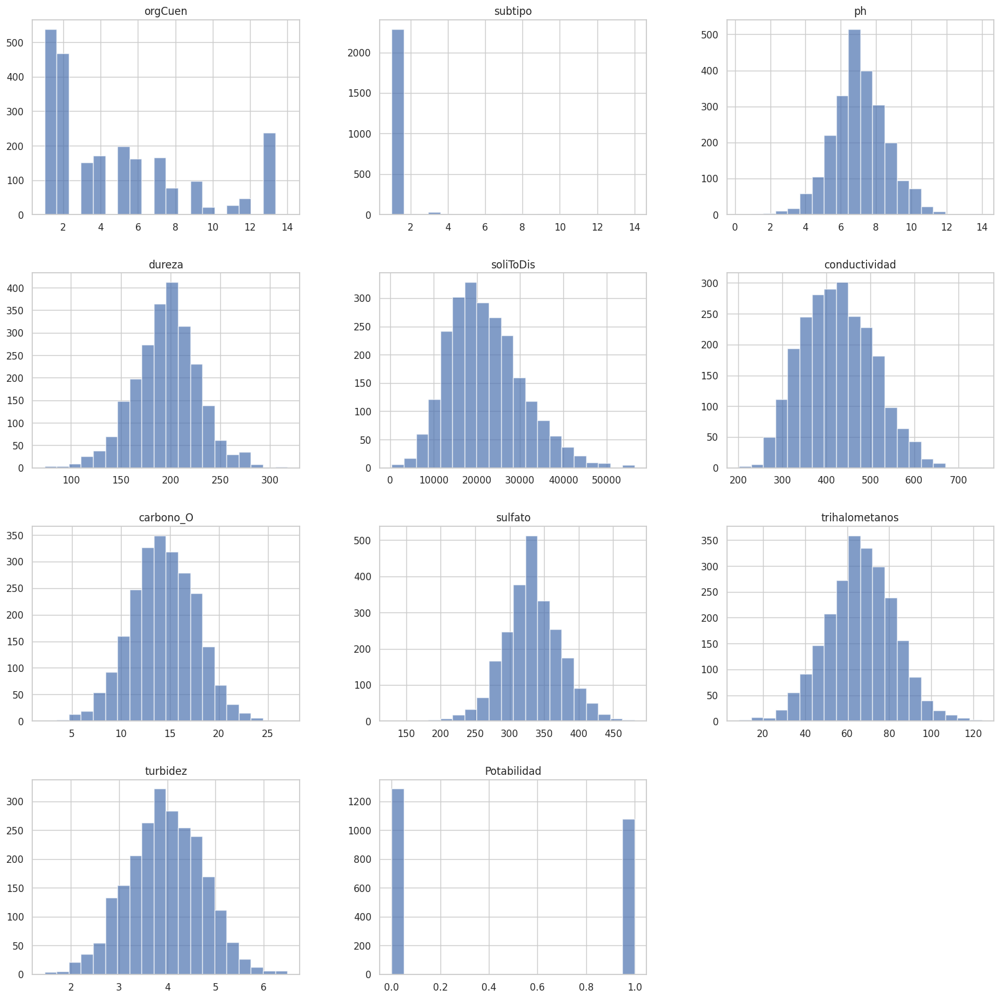

In [ ]:
# Dibujamos gráfica de frecuencia de todos los atributos
plt.rcParams['figure.figsize'] = [20,20];
sns.set(style="whitegrid")
df_aguaSub_limpio.hist(alpha=0.7, bins=20)
plt.show()

> * **

> * **Se ha notado que la variable 'SUBTIPO' tiene una distribución asimétrica hacia la derecha, ya que la media es mayor que la mediana. Dado que la mayoría de las cuencas son pozos, se realizará un análisis de la importancia de cada variable para verificar si 'SUBTIPO' es significativa para el modelo de machine learning.**

> * **



####<font color='red'>🔴**2.3.1.- Feature Importances**

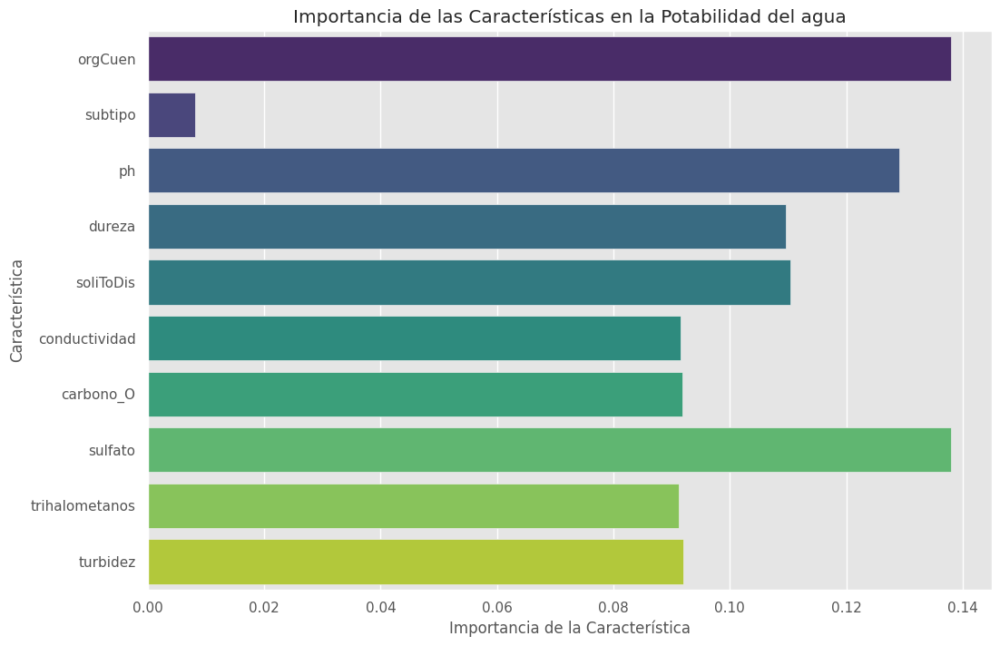

------------------------------------------------------------

[0.13804477 0.0081556  0.12915642 0.10967769 0.11036804 0.09159137
 0.09186527 0.13795644 0.09117082 0.0920136 ]


In [175]:
# Separar características y variable objetivo
X = df_aguaSub_limpio.drop(['Potabilidad'], axis=1)
y = df_aguaSub_limpio['Potabilidad']

# Escalar características STANDARD SCALER
scaler = RobustScaler()
X_scaled = scaler.fit_transform(X)

# Dividir datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Entrenar el modelo Random Forest
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Calcular la importancia de las características
feature_importances = rf_model.feature_importances_

# Crear la gráfica de barras
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances, y=X.columns, palette='viridis')
plt.xlabel('Importancia de la Característica')
plt.ylabel('Característica')
plt.title('Importancia de las Características en la Potabilidad del agua')
plt.show()
print('------------------------------------------------------------\n')
print(feature_importances)

> * **

> * **Al analizar la importancia de las características en nuestro modelo de machine learning, hemos observado que la variable "subtipo" contribuye muy poco a la predicción, representando menos del 0.08% de importancia en el modelo. Esto sugiere que la presencia de esta variable podría introducir ruido innecesario en nuestras predicciones sin aportar significativamente a la capacidad predictiva del modelo. Por lo tanto, hemos decidido eliminarla del conjunto de datos para mejorar la eficacia y la simplicidad del modelo.**
> * **

In [176]:
df_aguaSub_limpio=df_aguaSub_limpio.drop(['subtipo'], axis=1)
df_aguaSub_limpio.head()

,orgCuen,ph,dureza,soliToDis,conductividad,carbono_O,sulfato,trihalometanos,turbidez,Potabilidad
0,2,9.792728,161.057881,30249.17080,413.155466,12.493388,258.038852,76.225580,3.729120,1
1,13,4.959853,215.854869,9887.83075,527.479694,14.326638,379.504731,52.388849,3.455045,1
2,1,6.832217,164.274393,14015.04480,389.978097,14.836637,281.678040,44.367574,3.145416,0
3,1,7.333478,233.721355,16066.55210,401.739309,15.313978,224.212503,81.842062,4.772663,1
4,2,7.027186,185.320701,30988.97300,326.269080,9.982010,327.462670,52.716589,5.353043,0


####<font color='red'>🔴 **2.3.2.- Tratamientos de valores atípicos** </font>

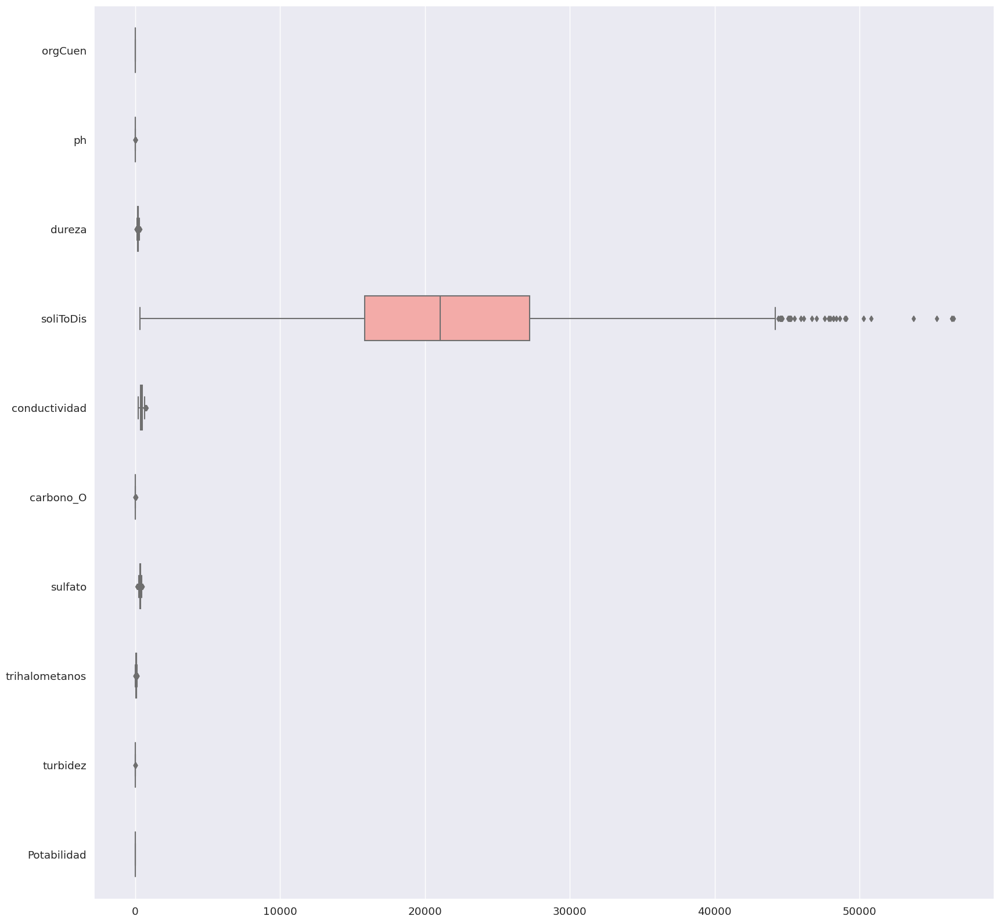

In [ ]:
# Dibujamos gráfica de boxplot de todos los atributos
plt.rcParams['figure.figsize'] = [20,20];
sns.set(style="whitegrid")
sns.set(font_scale=1.2)
#df_banco.boxplot(rot=60, figsize=(20,20))
sns.boxplot(data=df_aguaSub_limpio, orient="h", palette="pastel", width=0.5)
plt.show()

> * **Confirmamos sobre nuestro analisis numerico la variable Solidos Totales Disueltos tiene una media y una desviación estándar altas en comparación con otras características. entonces la distribución debe ser alta. Esto sugiere que la distribución de esa variable puede tener una mayor dispersión de datos y una mayor variabilidad en comparación con las demás**

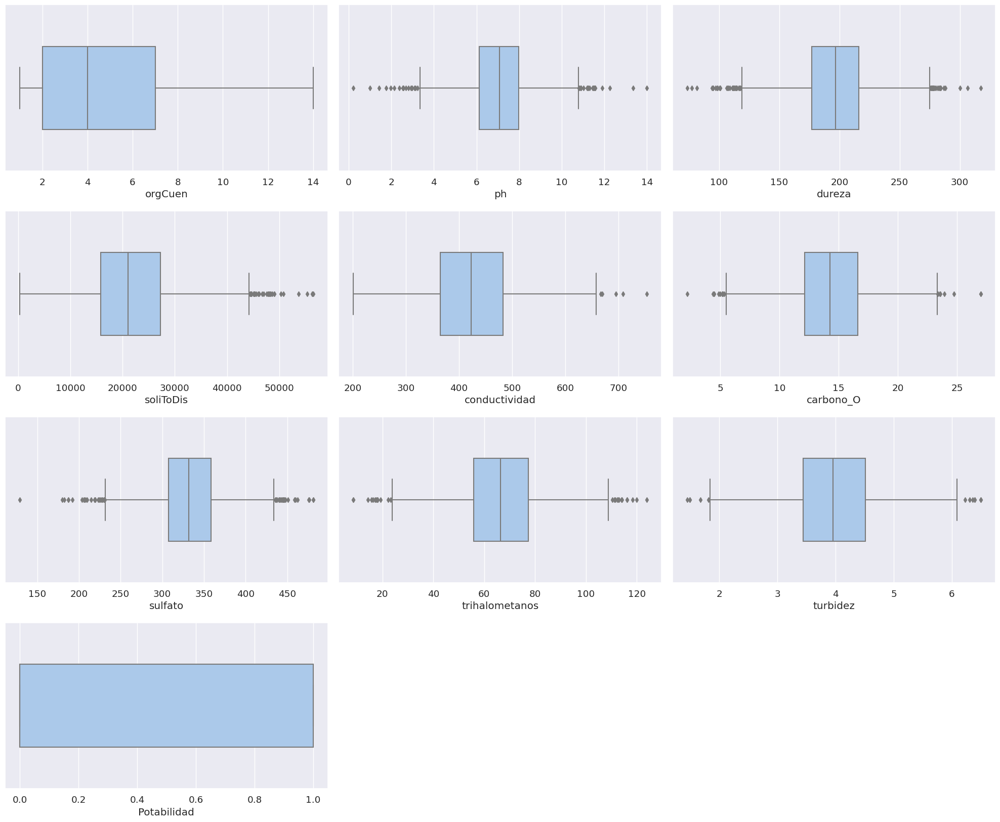

In [ ]:

plt.figure(figsize=(20, 20))
# Iterar sobre cada columna en df_aguaSub_limpio y crear un boxplot para cada una
for i, column in enumerate(df_aguaSub_limpio.columns):
    plt.subplot(5, 3, i+1)  # Configurar el subplot
    sns.boxplot(x=df_aguaSub_limpio[column], orient="h", palette="pastel", width=0.5)  # Crear el boxplot
    plt.xlabel(column)  # Agregar etiqueta al eje x
    plt.ylabel('')  # Eliminar etiqueta del eje y para mayor claridad
    plt.tight_layout()  # Ajustar el diseño de los subplots
plt.show()

In [ ]:
df_aguaSub_limpio.describe().T

,count,mean,std,min,25%,50%,75%,max
orgCuen,2368.0,4.831081,3.889389,1.000000,2.000000,4.000000,7.000000,14.000000
ph,2368.0,7.087112,1.536346,0.227499,6.124804,7.075428,7.989376,14.000000
dureza,2368.0,195.734264,32.334618,73.492234,176.789851,196.824477,216.117775,317.338124
soliToDis,2368.0,22017.819219,8577.073549,320.942611,15852.864335,21041.034750,27231.111975,56488.672400
conductividad,2368.0,426.239386,81.079953,201.619737,365.228259,422.452269,482.487877,753.342620
carbono_O,2368.0,14.343020,3.304900,2.200000,12.130794,14.287907,16.615199,27.006707
sulfato,2368.0,332.888586,41.147465,129.000000,307.606960,331.908065,358.333077,481.030642
trihalometanos,2368.0,66.387885,16.135431,8.577013,55.811222,66.402994,77.267739,124.000000
turbidez,2368.0,3.968832,0.777670,1.450000,3.442666,3.959406,4.511555,6.494749
Potabilidad,2368.0,0.456081,0.498173,0.000000,0.000000,0.000000,1.000000,1.000000


> * **

> * **Como podemos observar presenta outliers las variables ph, dureza, soli totales solidos, conductividad, carbono organico, trihalometanos y turbidez**

> * **Los atípicos para estas variables se observan por la parte del máximo valor de la variable, ya que el valor quantil 75, está alejado del máximo. De todas maneras esto se visualizará posteriormente.**

> * **El resto de variables, observamos que se manejan de forma adecuada, la distancia entre la media con los mínimos y máximos no es considerable. Además los quantiles 25 y 75 no están tan alejados del mínimo y máximo de la variable respectivamente. Esto nos demuestra la no presencia de atípicos para estas variables.**
> * **

Estas son las variables que hemos elegido para el tratamiento de Atípicos, luego de analizar sus gráficos de boxplot.



In [ ]:
df_aguaSub_limpio[['ph','dureza', 'soliToDis', 'conductividad', 'carbono_O','sulfato',
       'trihalometanos', 'turbidez']]

,ph,dureza,soliToDis,conductividad,carbono_O,sulfato,trihalometanos,turbidez
0,9.792728,161.057881,30249.17080,413.155466,12.493388,258.038852,76.225580,3.729120
1,4.959853,215.854869,9887.83075,527.479694,14.326638,379.504731,52.388849,3.455045
2,6.832217,164.274393,14015.04480,389.978097,14.836637,281.678040,44.367574,3.145416
3,7.333478,233.721355,16066.55210,401.739309,15.313978,224.212503,81.842062,4.772663
4,7.027186,185.320701,30988.97300,326.269080,9.982010,327.462670,52.716589,5.353043
...,...,...,...,...,...,...,...,...
2363,7.262535,212.521308,38713.11270,332.425224,14.098786,262.095022,70.300741,4.846359
2364,5.492156,176.271404,26422.09790,500.938788,7.609798,366.644766,59.396787,3.294129
2365,6.903817,258.526842,35455.70960,318.622622,13.961740,206.247229,65.866679,3.867843
2366,8.892998,224.078183,22960.18060,466.245480,9.693049,274.689459,59.577212,3.619133


In [ ]:
df_aguaSub_limpio[['ph','dureza', 'soliToDis', 'conductividad', 'carbono_O','sulfato',
       'trihalometanos', 'turbidez']].describe(percentiles=[0.01,0.025,0.05,0.1,0.5,0.75])

,ph,dureza,soliToDis,conductividad,carbono_O,sulfato,trihalometanos,turbidez
count,2368.000000,2368.000000,2368.000000,2368.000000,2368.000000,2368.000000,2368.000000,2368.000000
mean,7.087112,195.734264,22017.819219,426.239386,14.343020,332.888586,66.387885,3.968832
std,1.536346,32.334618,8577.073549,81.079953,3.304900,41.147465,16.135431,0.777670
min,0.227499,73.492234,320.942611,201.619737,2.200000,129.000000,8.577013,1.450000
1%,3.441694,114.433391,6095.483250,269.305364,6.104441,230.232359,28.842967,2.160049
2.5%,4.084963,128.591182,8001.741986,284.545577,7.848973,251.062384,33.600695,2.432006
5%,4.697223,141.489798,9639.431328,299.933517,8.908524,266.949611,39.776132,2.697042
10%,5.191108,154.563086,11927.709573,324.606489,10.239312,283.066908,45.716954,2.949787
50%,7.075428,196.824477,21041.034750,422.452269,14.287907,331.908065,66.402994,3.959406
75%,7.989376,216.117775,27231.111975,482.487877,16.615199,358.333077,77.267739,4.511555


In [ ]:
df_aguaSub_limpio[['ph','dureza', 'soliToDis', 'conductividad', 'carbono_O','sulfato',
       'trihalometanos', 'turbidez']].describe(percentiles=[0.5,0.75,0.9,0.95,0.975,0.99])

,ph,dureza,soliToDis,conductividad,carbono_O,sulfato,trihalometanos,turbidez
count,2368.000000,2368.000000,2368.000000,2368.000000,2368.000000,2368.000000,2368.000000,2368.000000
mean,7.087112,195.734264,22017.819219,426.239386,14.343020,332.888586,66.387885,3.968832
std,1.536346,32.334618,8577.073549,81.079953,3.304900,41.147465,16.135431,0.777670
min,0.227499,73.492234,320.942611,201.619737,2.200000,129.000000,8.577013,1.450000
50%,7.075428,196.824477,21041.034750,422.452269,14.287907,331.908065,66.402994,3.959406
75%,7.989376,216.117775,27231.111975,482.487877,16.615199,358.333077,77.267739,4.511555
90%,9.043524,235.094437,33527.307350,531.652540,18.488251,385.048147,86.187031,4.950233
95%,9.787637,248.111467,37982.327620,565.824328,19.633939,400.896015,91.851938,5.203461
97.5%,10.283766,262.741770,40847.034987,591.283430,20.765970,417.182937,98.238894,5.457670
99%,10.765996,276.710920,45229.279042,616.589797,22.059959,433.162304,105.314697,5.759634


> * **

> * **En condiciones normales un pH de 0 no existe en soluciones acuosas comunes. El pH de una solución puede ser tan bajo como 1 o 2 para ácidos fuertes, pero llegar a un pH de 0 sería extremadamente raro y generalmente requeriría condiciones muy corrosivas y peligrosas igual sucede con un ph 14 que es extremadamente raro en aguas subterraneas.**

> * **Los valores típicos para trihalometanos en aguas subterráneas suelen estar en el rango de 0 a 100 microgramos por litro (µg/L).**

> * **Hemos tratado también la variable Solidos Totales disueltos, ya que en el boxplot se ve cantidades muy altas por encima del bigote superior.**

>* **La conductividad eléctrica del agua se mide en microsiemens por centímetro (μS/cm) y puede variar según la concentración de sales disueltas y otros componentes en el agua. Los valores típicos de conductividad para el agua potable varían ampliamente, pero generalmente se encuentran en el rango de 50 a 800 μS/cm.**

>* **La turbidez varía generalmente entre 0 y 10 unidades de nefelometría turbia (NTU).**
> * **


#### **Análizamos los outlier de la variable PH**

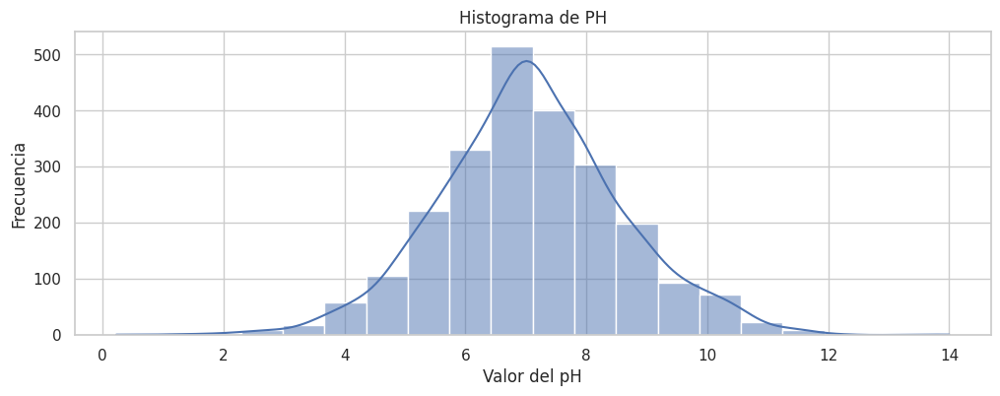

In [ ]:
## Gráfico de Histograma previo al truncamiento por percentiles
plt.figure(figsize=(12, 4))
sns.set(style="whitegrid")
sns.histplot(data=df_aguaSub_limpio['ph'], palette='Set2',kde=True, bins=20)
plt.title('Histograma de PH')
plt.xlabel('Valor del pH')
plt.ylabel('Frecuencia')
plt.show()

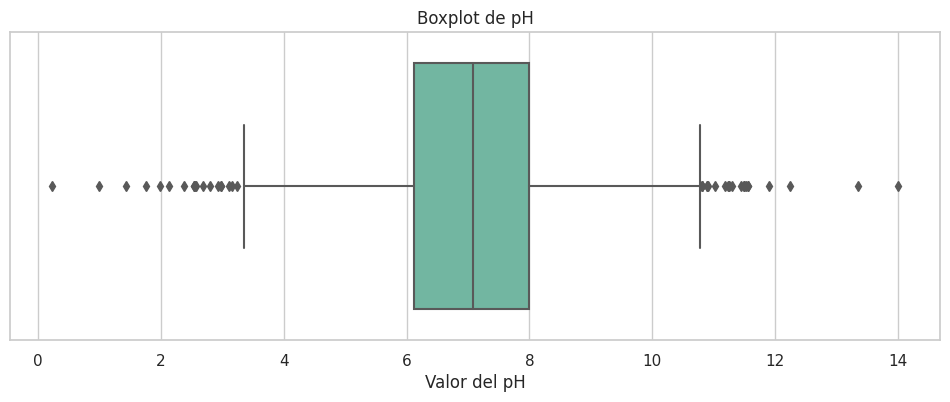

In [ ]:
plt.figure(figsize=(12, 4))
sns.set(style="whitegrid")
sns.boxplot(x=df_aguaSub_limpio['ph'], palette='Set2')
plt.title('Boxplot de pH')
plt.xlabel('Valor del pH')
plt.show()


In [ ]:
# Calcular los cuartiles del pH
qs = df_aguaSub_limpio['ph'].quantile([0.01, 0.5, 0.99]).values
q1 = qs[0]
q2 = qs[1]
q3 = qs[2]

# Dibujar los cuartiles superpuestos a los datos
fig = px.scatter(df_aguaSub_limpio, y='ph', width=1200, height=350)
fig.add_hline(y=q2, line_color='black', annotation_text='$q_{2}$')
fig.add_hline(y=q1, line_color='red', annotation_text='$q_{1}$')
fig.add_hline(y=q3, line_color='red', annotation_text='$q_{3}$')
fig.show()


In [ ]:
fig = px.box(df_aguaSub_limpio, y="ph", width = 600, height=400)
fig.show()

In [177]:
# Calculamos los percentiles p1 y p99
p1 = np.percentile(df_aguaSub_limpio['ph'],1)
p99 = np.percentile(df_aguaSub_limpio['ph'],99)
#Valores de los percentiles
p1, p99
df_aguaSub_limpioCapping = df_aguaSub_limpio.copy()
df_aguaSub_limpioCapping['ph'] = np.clip(df_aguaSub_limpio['ph'],p1,p99)
#Figura
fig = px.box(df_aguaSub_limpioCapping, y="ph", width = 600, height=400)
fig.show()

#### **Análizamos los outlier de la variable Solidos Totales Disueltos**

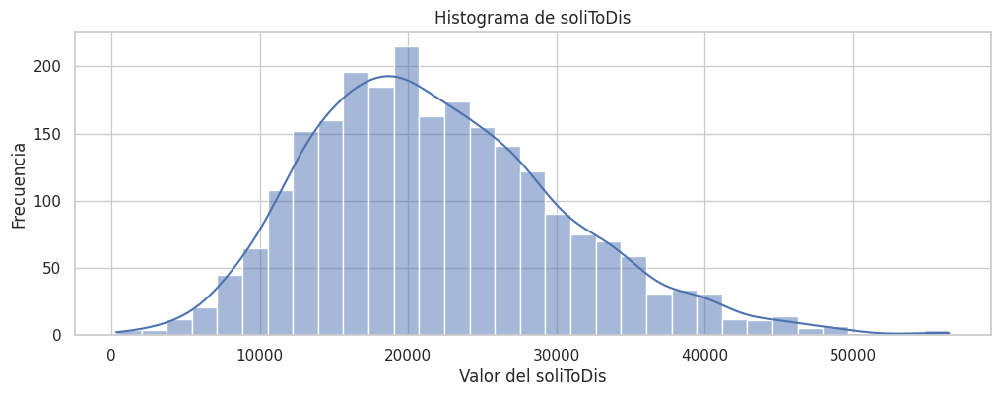

In [ ]:
## Gráfico de Histograma previo al truncamiento por percentiles
plt.figure(figsize=(12, 4))
sns.set(style="whitegrid")
sns.histplot(data=df_aguaSub_limpioCapping['soliToDis'], palette='Set2', kde=True)
plt.title('Histograma de soliToDis')
plt.xlabel('Valor del soliToDis')
plt.ylabel('Frecuencia')
plt.show()

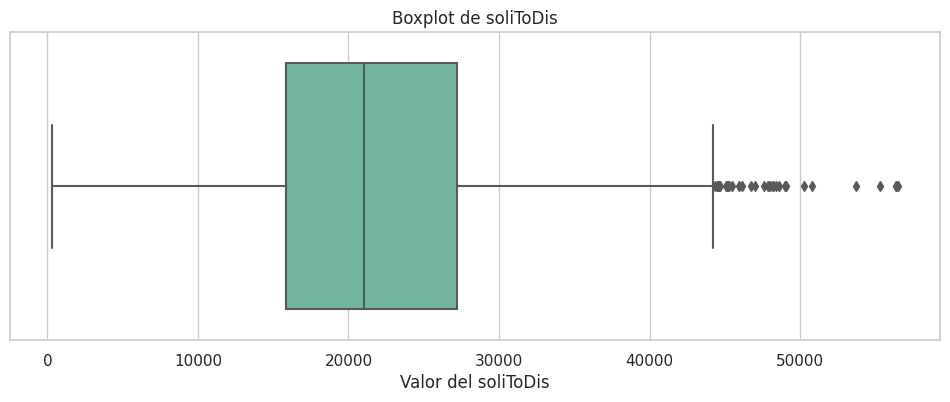

In [ ]:
plt.figure(figsize=(12, 4))
sns.set(style="whitegrid")
sns.boxplot(x=df_aguaSub_limpioCapping['soliToDis'], palette='Set2')
plt.title('Boxplot de soliToDis')
plt.xlabel('Valor del soliToDis')
plt.show()

In [ ]:
# Calcular los cuartiles del pH
qs = df_aguaSub_limpioCapping['soliToDis'].quantile([0, 0.5, 0.99]).values
q1 = qs[0]
q2 = qs[1]
q3 = qs[2]

# Dibujar los cuartiles superpuestos a los datos
fig = px.scatter(df_aguaSub_limpioCapping, y='soliToDis', width=1200, height=350)
fig.add_hline(y=q2, line_color='black', annotation_text='$q_{2}$')
fig.add_hline(y=q1, line_color='red', annotation_text='$q_{1}$')
fig.add_hline(y=q3, line_color='red', annotation_text='$q_{3}$')
fig.show()


In [ ]:
fig = px.box(df_aguaSub_limpioCapping, y="soliToDis", width = 600, height=400)
fig.show()

In [178]:
# Calculamos los percentiles p1 y p98
p0 = np.percentile(df_aguaSub_limpio['soliToDis'],0)
p99 = np.percentile(df_aguaSub_limpio['soliToDis'],99)
#Valores de los percentiles
print(p0, p99)
df_aguaSub_limpioCapping['soliToDis'] = np.clip(df_aguaSub_limpio['soliToDis'],p0,p99)
#Figura
fig = px.box(df_aguaSub_limpioCapping, y="soliToDis", width = 600, height=400)
fig.show()

320.942611 45229.2790425


#### **Análizamos los outlier de la variable Sulfato**

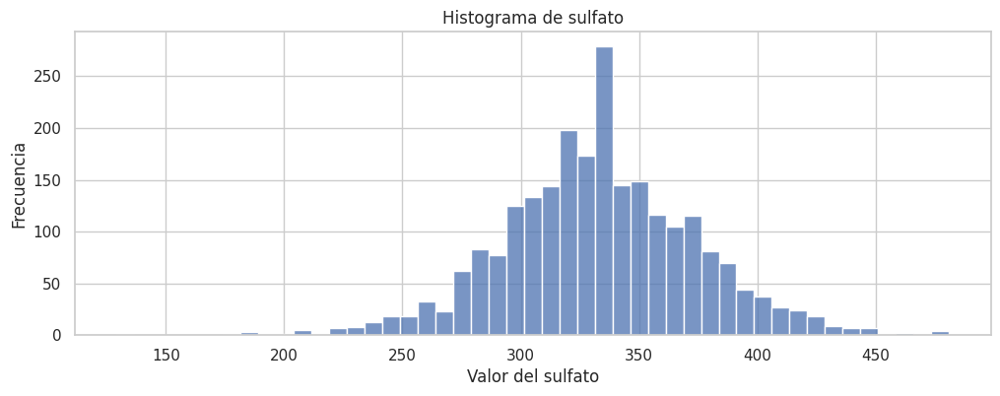

In [ ]:
## Gráfico de Histograma previo al truncamiento por percentiles
plt.figure(figsize=(12, 4))
sns.set(style="whitegrid")
sns.histplot(data=df_aguaSub_limpioCapping['sulfato'], palette='Set2')
plt.title('Histograma de sulfato')
plt.xlabel('Valor del sulfato')
plt.ylabel('Frecuencia')
plt.show()

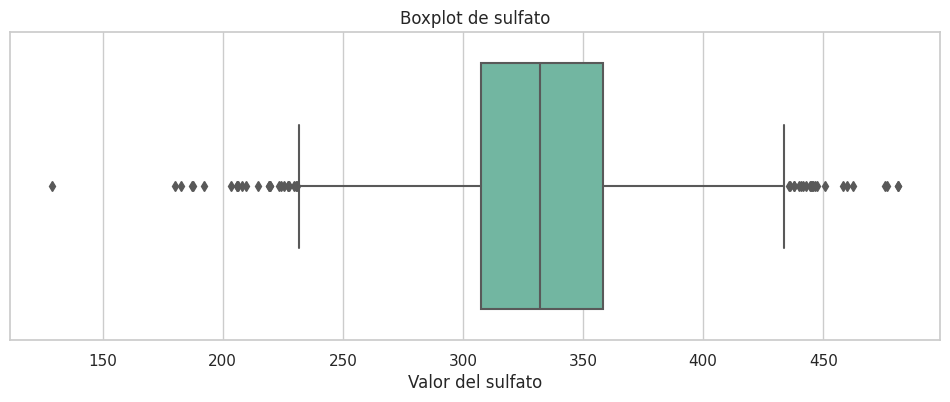

In [ ]:
plt.figure(figsize=(12, 4))
sns.set(style="whitegrid")
sns.boxplot(x=df_aguaSub_limpioCapping['sulfato'], palette='Set2')
plt.title('Boxplot de sulfato')
plt.xlabel('Valor del sulfato')
plt.show()

In [ ]:
# Calcular los cuartiles del pH
qs = df_aguaSub_limpioCapping['sulfato'].quantile([0.01, 0.5, 0.99]).values
q1 = qs[0]
q2 = qs[1]
q3 = qs[2]

# Dibujar los cuartiles superpuestos a los datos
fig = px.scatter(df_aguaSub_limpioCapping, y='sulfato', width=1200, height=350)
fig.add_hline(y=q2, line_color='black', annotation_text='$q_{2}$')
fig.add_hline(y=q1, line_color='red', annotation_text='$q_{1}$')
fig.add_hline(y=q3, line_color='red', annotation_text='$q_{3}$')
fig.show()

In [179]:
# Calculamos los percentiles p1 y p98
p1 = np.percentile(df_aguaSub_limpio['sulfato'],1)
p99 = np.percentile(df_aguaSub_limpio['sulfato'],99)
#Valores de los percentiles
print(p1, p99)
df_aguaSub_limpioCapping['sulfato'] = np.clip(df_aguaSub_limpioCapping['sulfato'],p1, p99)
#Figura
fig = px.box(df_aguaSub_limpioCapping, y="sulfato", width = 600, height=400)
fig.show()

230.23235865 433.16230446


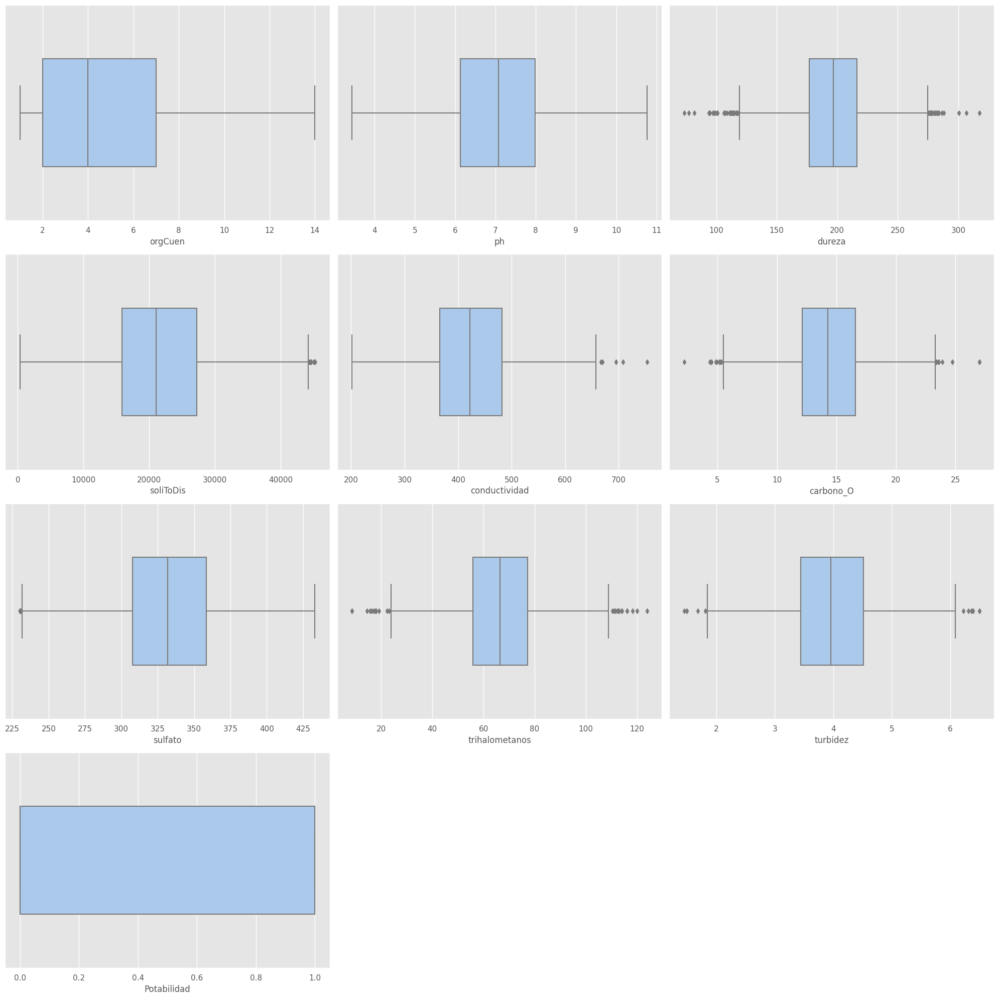

In [180]:
# Establecer el tamaño de la figura
plt.figure(figsize=(20, 20))
# Iterar sobre cada columna en df_aguaSub_limpio y crear un boxplot para cada una
for i, column in enumerate(df_aguaSub_limpioCapping.columns):
    plt.subplot(4, 3, i+1)  # Configurar el subplot
    sns.boxplot(x=df_aguaSub_limpioCapping[column], orient="h", palette="pastel", width=0.5)  # Crear el boxplot
    plt.xlabel(column)  # Agregar etiqueta al eje x
    plt.ylabel('')  # Eliminar etiqueta del eje y para mayor claridad
    plt.tight_layout()  # Ajustar el diseño de los subplots
plt.show()

In [181]:
df_aguaSub_limpio=df_aguaSub_limpioCapping.copy()
df_aguaSub_limpio.tail()

,orgCuen,ph,dureza,soliToDis,conductividad,carbono_O,sulfato,trihalometanos,turbidez,Potabilidad
2363,2,7.262535,212.521308,38713.1127,332.425224,14.098786,262.095022,70.300741,4.846359,0
2364,2,5.492156,176.271404,26422.0979,500.938788,7.609798,366.644766,59.396787,3.294129,0
2365,7,6.903817,258.526842,35455.7096,318.622622,13.961740,230.232359,65.866679,3.867843,1
2366,6,8.892998,224.078183,22960.1806,466.245480,9.693049,274.689459,59.577212,3.619133,1
2367,7,7.130099,275.679780,9480.6178,383.455068,18.322879,295.618838,94.416301,1.986192,0


###<font color='white'>⚪ **2.4.- Análisis Bibariado de la Variable Categorica** </font>

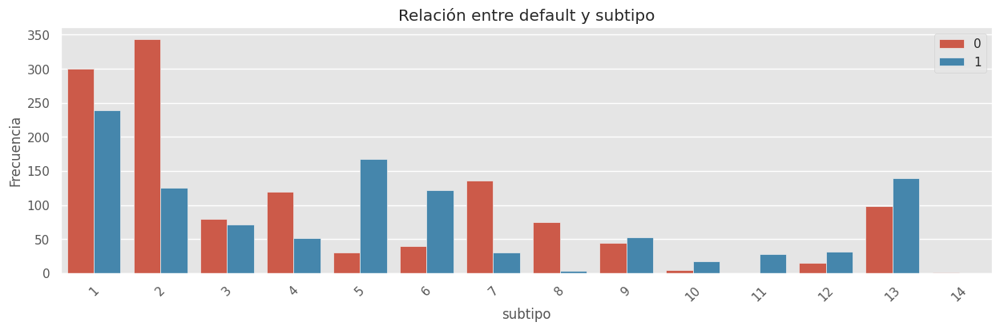

In [182]:
#Análisis bibariado con la variable objetivo de la variable SUBTIPO
plt.figure(figsize=(15, 4))
sns.countplot(x='orgCuen', hue='Potabilidad', data=df_aguaSub_limpio)
plt.title(f'Relación entre default y subtipo')
plt.xlabel('subtipo')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.legend(loc='best')
plt.show()

In [183]:
df_aguaSub_limpio[df_aguaSub_limpio['orgCuen']==14]

,orgCuen,ph,dureza,soliToDis,conductividad,carbono_O,sulfato,trihalometanos,turbidez,Potabilidad
2354,14,7.965337,151.541889,25274.6103,527.688242,15.792625,352.316182,52.26849,3.390982,0


In [185]:
# Eliminar todas las filas donde 'rango_edad' es igual a 6
df_aguaSub_limpio = df_aguaSub_limpio[(df_aguaSub_limpio['orgCuen'] != 14)].reset_index(drop=True)

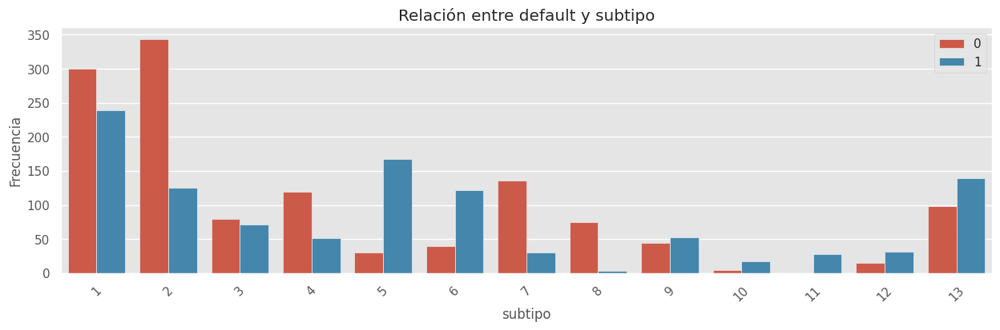

In [186]:
#Análisis bibariado con la variable objetivo de la variable SUBTIPO
plt.figure(figsize=(15, 4))
sns.countplot(x='orgCuen', hue='Potabilidad', data=df_aguaSub_limpio)
plt.title(f'Relación entre default y subtipo')
plt.xlabel('subtipo')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.legend(loc='best')
plt.show()

###<font color='white'>⚪ **2.5.- Análisis Multivariado - Correlación entre Variables** </font>

####<font color='white'>⚪ 2.5.1.- Gráfico de Disperción </font>

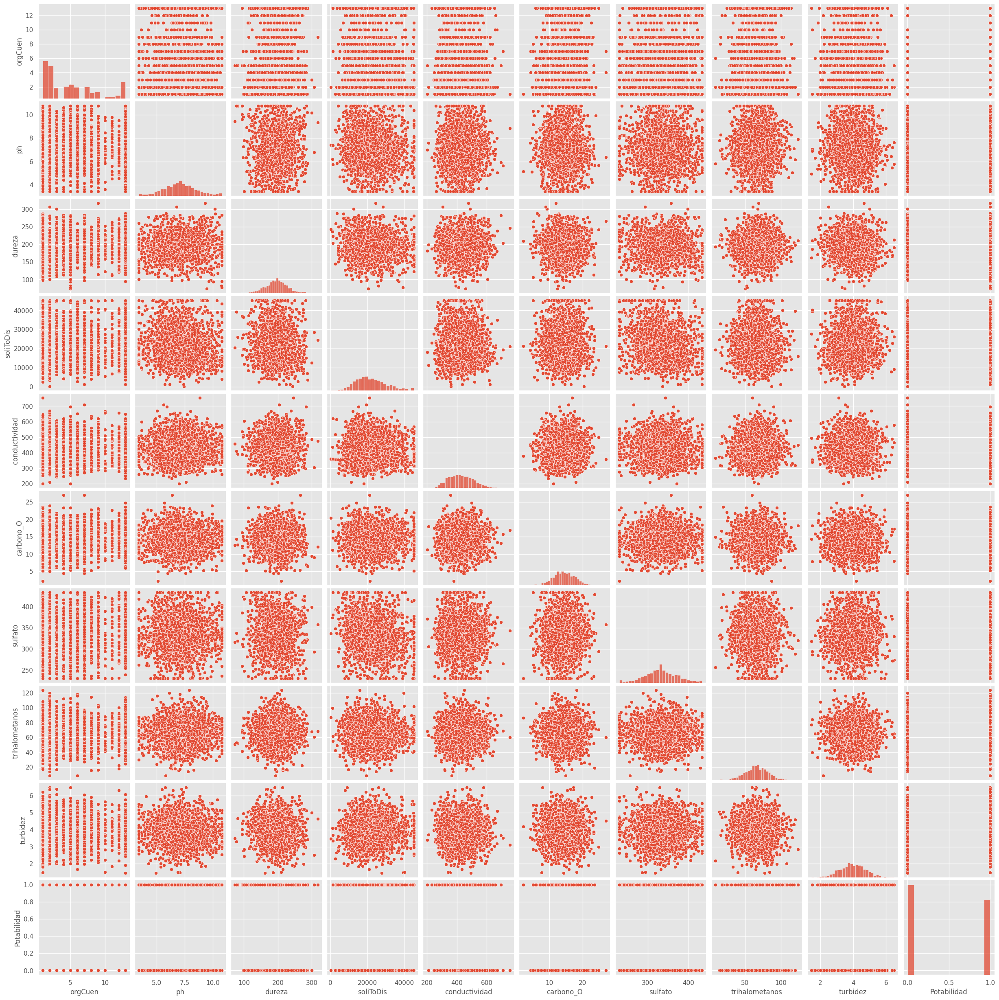

In [187]:
ax=sns.pairplot(df_aguaSub_limpio)

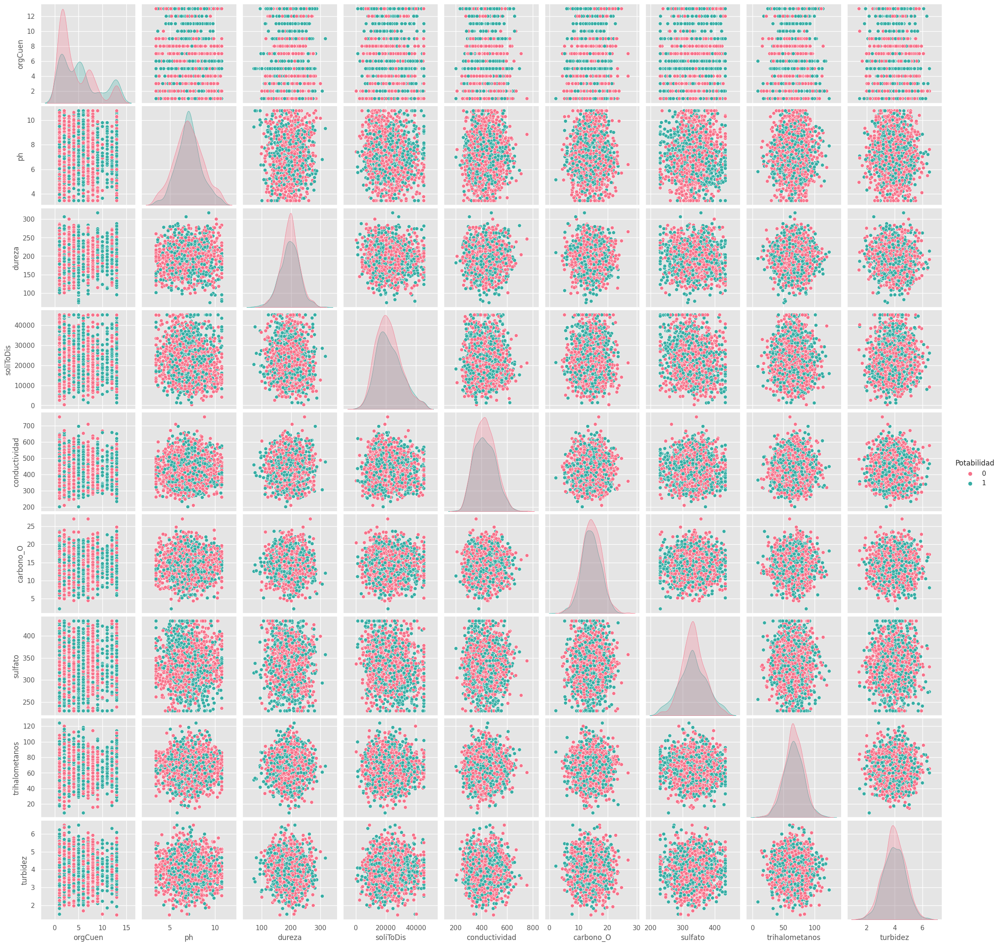

In [188]:
# Filtrar solo las variables numéricas
numeric_df = df_aguaSub_limpio.select_dtypes(include=['float64', 'int64'])

# Añadir la variable 'Potabilidad' al DataFrame numérico
numeric_df['Potabilidad'] = df_aguaSub_limpio['Potabilidad']

# Crear un pairplot
sns.pairplot(numeric_df, hue='Potabilidad', diag_kind='kde', palette='husl')

# Mostrar el pairplot
plt.show()

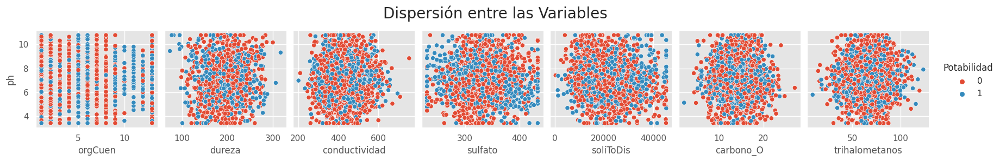

In [189]:
ax=sns.pairplot(df_aguaSub_limpio, y_vars='ph', x_vars=['orgCuen','dureza','conductividad','sulfato', 'soliToDis', 'carbono_O', 'trihalometanos'],hue='Potabilidad')#agregamos la recta regreción
ax.fig.suptitle('Dispersión entre las Variables', fontsize=20, y=1.15)
ax

>* **
>* **Se observa en las gráficas que las relaciones entre los datos de las variables son dispersas y no muestran una clara asociación entre ellas, lo que sugiere una correlación casi nula.**

>* **Además, se nota que hay más datos que indican que el agua no es potable en comparación con los que indican que sí lo es.**

>* **

####<font color='white'>⚪ 2.5.2.- Matriz de Correlación </font>

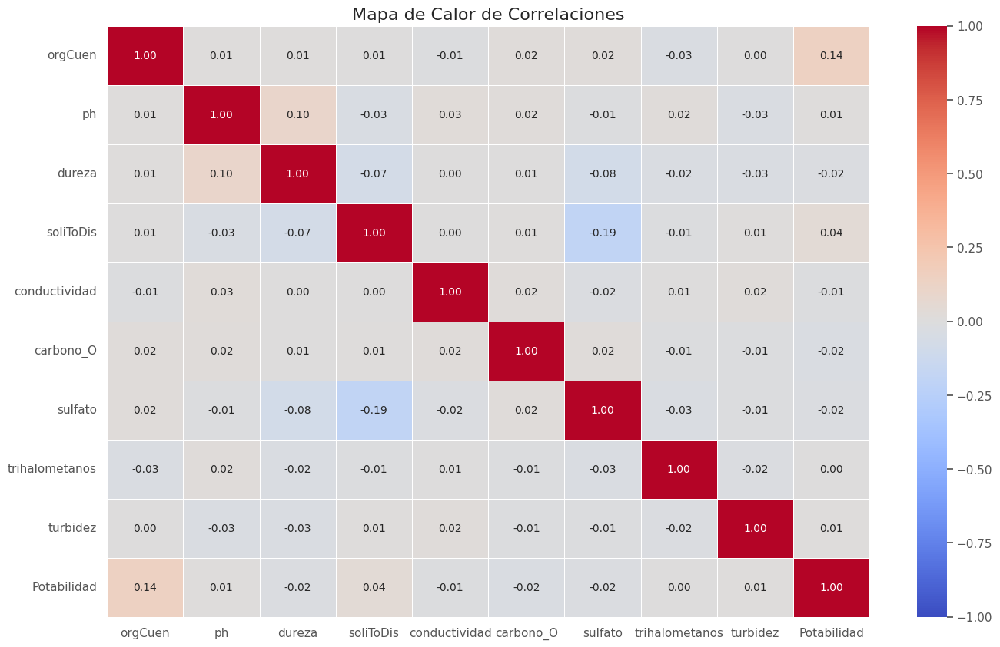

In [190]:
# Correlación entre variables
correlation_matrix = df_aguaSub_limpio.corr()
plt.figure(figsize=(16, 10))
sns.heatmap(correlation_matrix, vmin=-1, vmax=1, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Mapa de Calor de Correlaciones", fontsize=16)
plt.show()

>* **Después de revisar el gráfico de correlación, podemos concluir que las variables no muestran una relación significativa entre sí.**

In [191]:
## Observamos solo la correlación con el target
corr = df_aguaSub_limpio.corr()
corr[['Potabilidad']].sort_values(by='Potabilidad',ascending=False).style.background_gradient()

,Potabilidad
Potabilidad,1.000000
orgCuen,0.144455
soliToDis,0.042000
ph,0.009819
turbidez,0.009758
trihalometanos,0.000519
conductividad,-0.011981
dureza,-0.018750
sulfato,-0.021077
carbono_O,-0.023892


In [192]:
## Cuadro de correlación mostrando de forma colorida los valores entre variables
corr = df_aguaSub_limpio.corr()
corr.style.background_gradient()

,orgCuen,ph,dureza,soliToDis,conductividad,carbono_O,sulfato,trihalometanos,turbidez,Potabilidad
orgCuen,1.000000,0.013205,0.012866,0.007540,-0.014868,0.020843,0.019325,-0.029962,0.003691,0.144455
ph,0.013205,1.000000,0.097704,-0.034080,0.025501,0.017897,-0.008558,0.019112,-0.028097,0.009819
dureza,0.012866,0.097704,1.000000,-0.072787,0.004659,0.005350,-0.078596,-0.024025,-0.030105,-0.018750
soliToDis,0.007540,-0.034080,-0.072787,1.000000,0.001560,0.008383,-0.190311,-0.014664,0.012057,0.042000
conductividad,-0.014868,0.025501,0.004659,0.001560,1.000000,0.020801,-0.018877,0.006127,0.017848,-0.011981
carbono_O,0.020843,0.017897,0.005350,0.008383,0.020801,1.000000,0.016641,-0.012754,-0.013267,-0.023892
sulfato,0.019325,-0.008558,-0.078596,-0.190311,-0.018877,0.016641,1.000000,-0.025178,-0.012778,-0.021077
trihalometanos,-0.029962,0.019112,-0.024025,-0.014664,0.006127,-0.012754,-0.025178,1.000000,-0.020101,0.000519
turbidez,0.003691,-0.028097,-0.030105,0.012057,0.017848,-0.013267,-0.012778,-0.020101,1.000000,0.009758
Potabilidad,0.144455,0.009819,-0.018750,0.042000,-0.011981,-0.023892,-0.021077,0.000519,0.009758,1.000000


####<font color='white'>⚪ 2.5.3.- VIF para detección de multicolinealidad </font>

**VIF.-** Factor de Inflación de la Varianza- El VIF mide la multicolinealidad entre las variables predictoras. Un VIF mayor indica una mayor multicolinealidad.

>* **Si bien es cierto que valores altos de VIF pueden indicar multicolinealidad, no necesariamente implica que debamos eliminar esas variables automáticamente. Usaremos esto como herramienta para que nos ayude a determinar si vamos por el camino correcto al eliminar ciertas variables, considerando si estás variables son o no importantes para nuestro análisis.**

>* **Normalmente se considera que valores de VIF mayores de 10, son malos y generan multicolinealidad, pero tambien lo analizaremos con nuestra matriz de correlación y nuestro expertiz del negocio.**

In [193]:
## Analizamos primero para todas nuestras variables menos la variable objetivo
X = df_aguaSub_limpio.drop(columns=['Potabilidad'])

# VIF para detección de multicolinealidad
def calculate_vif(X):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data

vif_result = calculate_vif(X)
vif_result.style.background_gradient()

,Variable,VIF
0,orgCuen,2.540572
1,ph,22.312613
2,dureza,31.300665
3,soliToDis,7.335332
4,conductividad,25.771869
5,carbono_O,18.610829
6,sulfato,45.678097
7,trihalometanos,16.448169
8,turbidez,23.847779


>* **

>* **Observamos que según este análisis, muchas variables tienes valores de VIF elevados, mayores de 10. Esto nos indica que podrían afectar a nuestro modelo generando multicolinealidad y por ende afectando nuestros coeficientes del modelo.**

>* **Ahora bien, tambien tenemos que notar que algunas variables con VIF elevados son importantes para nuestros análisis, según lo deducido previamente con nuestra matriz de correlación.**

>* **Los sulfatos son elementos naturales presentes en minerales, suelos y rocas. Son importantes para la calidad del agua subterránea, ya que su presencia puede indicar la presencia de contaminantes o minerales que afectan su utilidad para el consumo humano y otros usos. Por lo tanto, monitorear los niveles de sulfatos es esencial para garantizar la seguridad del agua subterránea.**

* **CONCLUSIÓN**

>* **Entendiendo la idea del negocio con mis variables predictoras y teniendo en cuenta que se realizo anteriormete un Feature Importances y eliminado previamente la variable subtipo entendemos que las demás variables se consideran importantes para nuestro modelo.**

>* **

## <font color='orange'>🟠 **3. Construcción de los Modelos** </font>

In [194]:
df_aguaSub_limpio.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2367 entries, 0 to 2366
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   orgCuen         2367 non-null   int64  
 1   ph              2367 non-null   float64
 2   dureza          2367 non-null   float64
 3   soliToDis       2367 non-null   float64
 4   conductividad   2367 non-null   float64
 5   carbono_O       2367 non-null   float64
 6   sulfato         2367 non-null   float64
 7   trihalometanos  2367 non-null   float64
 8   turbidez        2367 non-null   float64
 9   Potabilidad     2367 non-null   int64  
dtypes: float64(8), int64(2)
memory usage: 185.0 KB


In [195]:
## Separando nuestros datos en prueba y entrenamiento
X = df_aguaSub_limpio.drop(columns='Potabilidad')
y = df_aguaSub_limpio['Potabilidad']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [196]:
X_train.head()

,orgCuen,ph,dureza,soliToDis,conductividad,carbono_O,sulfato,trihalometanos,turbidez
2206,7,8.801934,225.895468,23659.2115,446.992465,14.340818,408.417866,42.800911,3.769832
1725,11,7.933068,204.724281,12732.8882,449.685602,15.669628,331.087177,55.404080,4.534233
1486,13,6.174884,193.027960,23006.2422,297.112621,13.475158,340.253354,78.325227,3.623298
1073,1,6.174751,138.513588,21504.1388,447.805465,14.241965,338.703016,31.705933,2.566049
1146,1,7.260904,189.077962,21391.1625,390.285266,14.391606,356.622222,81.082456,4.383823


In [197]:
y_train.head()

2206    0
1725    1
1486    0
1073    1
1146    0
Name: Potabilidad, dtype: int64

In [198]:
## Validando las dimensiones de nuestros datos a analizar
X_train.shape, y_train.shape

((1775, 9), (1775,))

In [199]:
## Validando las dimensiones de nuestros datos a analizar
X_test.shape, y_test.shape

((592, 9), (592,))

##**Estandarización de datos**

In [200]:
scaler = RobustScaler()

In [201]:
scaler.fit(X_train)

RobustScaler()

In [202]:
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [203]:
pd.DataFrame(X_train_scaled).head()

,0,1,2,3,4,5,6,7,8
0,0.6,0.912899,0.736651,0.240923,0.215558,0.003171,1.523536,-1.114565,-0.161689
1,1.4,0.453482,0.200947,-0.697900,0.238752,0.300349,-0.016346,-0.518702,0.562052
2,1.8,-0.476167,-0.095010,0.184818,-1.075261,-0.190427,0.166179,0.564982,-0.300428
3,-0.6,-0.476238,-1.474411,0.055753,0.222560,-0.018936,0.135308,-1.639122,-1.301440
4,-0.6,0.098072,-0.194958,0.046045,-0.272825,0.014530,0.492132,0.695341,0.419643


In [204]:
pd.DataFrame(X_test_scaled).head()

,0,1,2,3,4,5,6,7,8
0,0.2,-0.149868,0.344764,0.826292,0.613336,1.265573,-0.105982,-0.248454,-0.971943
1,-0.6,0.597559,0.199468,-0.295640,-0.649568,-0.407261,-1.097960,0.829343,1.125682
2,1.8,1.302034,0.095513,-0.069689,-0.744183,0.516510,-0.557338,0.233264,-0.867321
3,0.8,-0.698600,1.134091,0.946529,0.637158,1.886886,-2.024664,0.238936,1.874328
4,0.0,0.000000,0.833560,0.136556,-0.283628,0.262758,-0.217409,-1.519021,-0.084692


### <font color='white'>⚪ **3.1.- Regresión Logística** </font>

In [205]:
## Entrenando el modelo
model = LogisticRegression(random_state=42)
model.fit(X_train_scaled, y_train)

LogisticRegression(random_state=42)

In [206]:
y_pred = model.predict(X_test_scaled)

In [207]:
report = classification_report(y_test, y_pred, target_names=["No_Potable", "Potable"], output_dict=True)
pd.DataFrame(report).style.background_gradient()

,No_Potable,Potable,accuracy,macro avg,weighted avg
precision,0.613909,0.537143,0.591216,0.575526,0.580842
recall,0.759644,0.368627,0.591216,0.564136,0.591216
f1-score,0.679045,0.437209,0.591216,0.558127,0.574876
support,337.000000,255.000000,0.591216,592.000000,592.000000


In [208]:
## Calculamos la predicción de probabilidad para nuestros datos de prueba, esto nos servirá para los calculos de AUC-ROC
y_proba_test = model.predict_proba(X_test_scaled)[:,1]

In [209]:
## En este caso, sabemos que la clase 1 - Potable
## Por ende procedemos a calcular las métricas para esta clase
accuracy = accuracy_score(y_test, y_pred)
precision = report['Potable']['precision']
recall = report['Potable']['recall']
f1 = report['Potable']['f1-score']
auc_roc = roc_auc_score(y_test,y_proba_test)
metricas_regresion_logistica = []
metricas_regresion_logistica.extend([accuracy,precision,recall,f1,auc_roc])
print('Accuracy:', accuracy)
print('Precision:',precision)
print('Recall:', recall)
print('F1-score:',f1)
print('AUC-ROC:',auc_roc)

Accuracy: 0.5912162162162162
Precision: 0.5371428571428571
Recall: 0.3686274509803922
F1-score: 0.4372093023255814
AUC-ROC: 0.5913772037004713


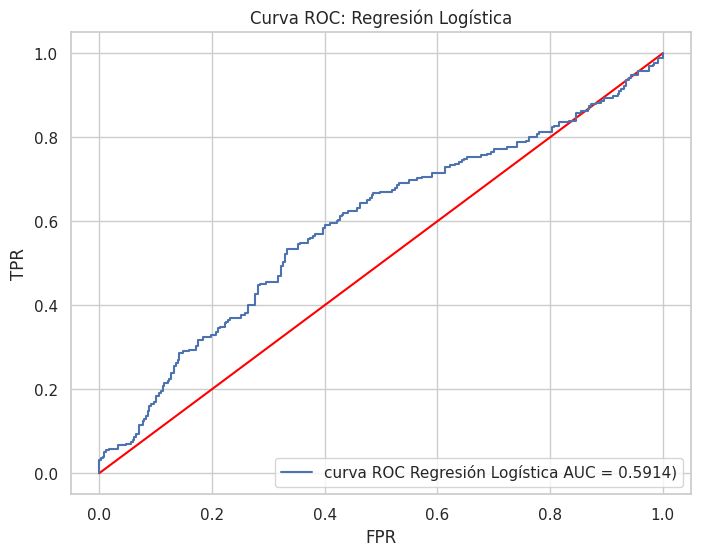

In [210]:
## Graficando nuestro curva ROC
auc_roc = roc_auc_score(y_test,y_proba_test)
fpr, tpr, thresholds = roc_curve(y_test,y_proba_test)
plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
plt.plot(fpr,fpr,color='red')
plt.plot(fpr,tpr,label=(f'curva ROC Regresión Logística AUC = {auc_roc:.4f})'))
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Curva ROC: Regresión Logística')
plt.legend(loc = 'lower right')

### <font color='white'>⚪ **3.2.- Árbol de Desición** </font>

In [211]:
## Entrenando el modelo
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train_scaled, y_train)

DecisionTreeClassifier(random_state=42)

In [212]:
y_pred = model.predict(X_test_scaled)

In [213]:
report = classification_report(y_test, y_pred, target_names=["No_Potable", "Potable"], output_dict=True)
pd.DataFrame(report).style.background_gradient()

,No_Potable,Potable,accuracy,macro avg,weighted avg
precision,0.754153,0.621993,0.689189,0.688073,0.697226
recall,0.673591,0.709804,0.689189,0.691697,0.689189
f1-score,0.711599,0.663004,0.689189,0.687301,0.690667
support,337.000000,255.000000,0.689189,592.000000,592.000000


In [214]:
## Calculamos la predicción de probabilidad para nuestros datos de prueba, esto nos servirá para los calculos de AUC-ROC
y_proba_test = model.predict_proba(X_test_scaled)[:,1]

In [215]:
## En este caso, sabemos que la clase 1 - agua Potable
## Por ende procedemos a calcular las métricas para esta clase
accuracy = accuracy_score(y_test, y_pred)
precision = report['Potable']['precision']
recall = report['Potable']['recall']
f1 = report['Potable']['f1-score']
auc_roc = roc_auc_score(y_test,y_proba_test)
metricas_arbol_decision = []
metricas_arbol_decision.extend([accuracy,precision,recall,f1,auc_roc])
print('Accuracy:', accuracy)
print('Precision:',precision)
print('Recall:', recall)
print('F1-score:',f1)
print('AUC-ROC:',auc_roc)

Accuracy: 0.6891891891891891
Precision: 0.6219931271477663
Recall: 0.7098039215686275
F1-score: 0.663003663003663
AUC-ROC: 0.6916972130098331


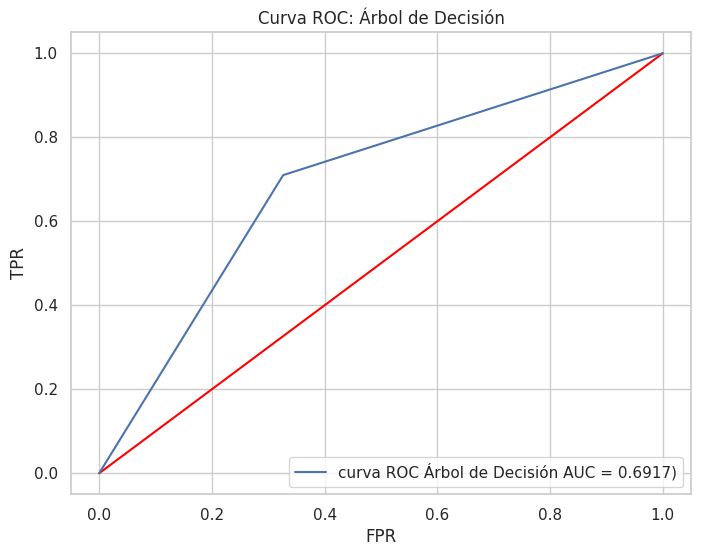

In [216]:
## Graficando nuestro curva ROC
auc_roc = roc_auc_score(y_test,y_proba_test)
fpr, tpr, thresholds = roc_curve(y_test,y_proba_test)
plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
plt.plot(fpr,fpr,color='red')
plt.plot(fpr,tpr,label=(f'curva ROC Árbol de Decisión AUC = {auc_roc:.4f})'))
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Curva ROC: Árbol de Decisión')
plt.legend(loc = 'lower right')

### <font color='white'>⚪ **3.3.- Random Forest** </font>

In [217]:
## Entrenando el modelo
model = RandomForestClassifier(random_state=42)
model.fit(X_train_scaled, y_train)

RandomForestClassifier(random_state=42)

In [218]:
y_pred = model.predict(X_test_scaled)

In [219]:
report = classification_report(y_test, y_pred, target_names=["No_Potable", "Potable"], output_dict=True)
pd.DataFrame(report).style.background_gradient()

,No_Potable,Potable,accuracy,macro avg,weighted avg
precision,0.793003,0.738956,0.770270,0.765979,0.769722
recall,0.807122,0.721569,0.770270,0.764345,0.770270
f1-score,0.800000,0.730159,0.770270,0.765079,0.769916
support,337.000000,255.000000,0.770270,592.000000,592.000000


In [220]:
## Calculamos la predicción de probabilidad para nuestros datos de prueba, esto nos servirá para los calculos de AUC-ROC
y_proba_test = model.predict_proba(X_test_scaled)[:,1]

In [221]:
## En este caso, sabemos que la clase 1 - Potable
## Por ende procedemos a calcular las métricas para esta clase
accuracy = accuracy_score(y_test, y_pred)
precision = report['Potable']['precision']
recall = report['Potable']['recall']
f1 = report['Potable']['f1-score']
auc_roc = roc_auc_score(y_test,y_proba_test)
metricas_random_forest = []
metricas_random_forest.extend([accuracy,precision,recall,f1,auc_roc])
print('Accuracy:', accuracy)
print('Precision:',precision)
print('Recall:', recall)
print('F1-score:',f1)
print('AUC-ROC:',auc_roc)

Accuracy: 0.7702702702702703
Precision: 0.7389558232931727
Recall: 0.7215686274509804
F1-score: 0.7301587301587302
AUC-ROC: 0.8334206085995229


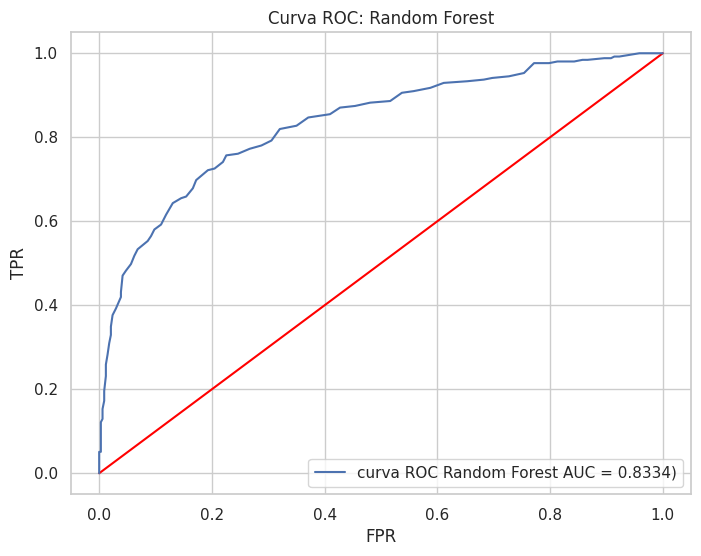

In [222]:
## Graficando nuestro curva ROC
auc_roc = roc_auc_score(y_test,y_proba_test)
fpr, tpr, thresholds = roc_curve(y_test,y_proba_test)
plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
plt.plot(fpr,fpr,color='red')
plt.plot(fpr,tpr,label=(f'curva ROC Random Forest AUC = {auc_roc:.4f})'))
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Curva ROC: Random Forest')
plt.legend(loc = 'lower right')

### <font color='white'>⚪ **3.4.- Naive Bayes** </font>

In [223]:
## Entrenando el modelo
model = GaussianNB()
model.fit(X_train_scaled, y_train)

GaussianNB()

In [224]:
y_pred = model.predict(X_test_scaled)

In [225]:
report = classification_report(y_test, y_pred, target_names=["No_Potable", "Potable"], output_dict=True)
pd.DataFrame(report).style.background_gradient()

,No_Potable,Potable,accuracy,macro avg,weighted avg
precision,0.646617,0.590674,0.628378,0.618645,0.622519
recall,0.765579,0.447059,0.628378,0.606319,0.628378
f1-score,0.701087,0.508929,0.628378,0.605008,0.618316
support,337.000000,255.000000,0.628378,592.000000,592.000000


In [226]:
## Calculamos la predicción de probabilidad para nuestros datos de prueba, esto nos servirá para los calculos de AUC-ROC
y_proba_test = model.predict_proba(X_test_scaled)[:,1]

In [227]:
## En este caso, sabemos que la clase 1 - Potable
## Por ende procedemos a calcular las métricas para esta clase
accuracy = accuracy_score(y_test, y_pred)
precision = report['Potable']['precision']
recall = report['Potable']['recall']
f1 = report['Potable']['f1-score']
auc_roc = roc_auc_score(y_test,y_proba_test)
metricas_naive_bayes = []
metricas_naive_bayes.extend([accuracy,precision,recall,f1,auc_roc])
print('Accuracy:', accuracy)
print('Precision:',precision)
print('Recall:', recall)
print('F1-score:',f1)
print('AUC-ROC:',auc_roc)

Accuracy: 0.6283783783783784
Precision: 0.5906735751295337
Recall: 0.4470588235294118
F1-score: 0.5089285714285714
AUC-ROC: 0.6589398964333508


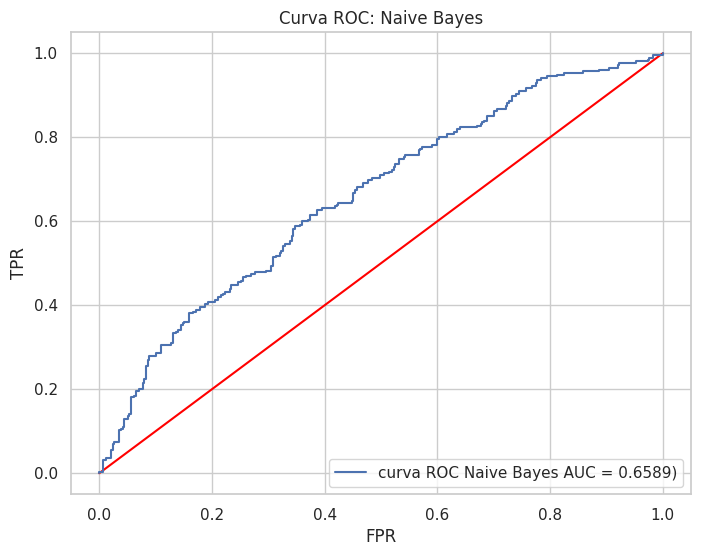

In [228]:
## Graficando nuestro curva ROC
auc_roc = roc_auc_score(y_test,y_proba_test)
fpr, tpr, thresholds = roc_curve(y_test,y_proba_test)
plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
plt.plot(fpr,fpr,color='red')
plt.plot(fpr,tpr,label=(f'curva ROC Naive Bayes AUC = {auc_roc:.4f})'))
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Curva ROC: Naive Bayes')
plt.legend(loc = 'lower right')
plt.show()

### <font color='white'>⚪ **3.5.- XG Boost** </font>

In [229]:
model = XGBClassifier(random_state=42)
model.fit(X_train_scaled, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [230]:
# Predecir en el conjunto de prueba
y_pred = model.predict(X_test_scaled)

In [231]:
report = classification_report(y_test, y_pred, target_names=["No_Potable", "Potable"], output_dict=True)
pd.DataFrame(report).style.background_gradient()

,No_Potable,Potable,accuracy,macro avg,weighted avg
precision,0.768072,0.684615,0.731419,0.726344,0.732124
recall,0.756677,0.698039,0.731419,0.727358,0.731419
f1-score,0.762332,0.691262,0.731419,0.726797,0.731719
support,337.000000,255.000000,0.731419,592.000000,592.000000


In [232]:
## Calculamos la predicción de probabilidad para nuestros datos de prueba, esto nos servirá para los calculos de AUC-ROC
y_proba_test = model.predict_proba(X_test_scaled)[:,1]

In [233]:
## En este caso, sabemos que la clase 1 - Potable
## Por ende procedemos a calcular las métricas para esta clase
accuracy = accuracy_score(y_test, y_pred)
precision = report['Potable']['precision']
recall = report['Potable']['recall']
f1 = report['Potable']['f1-score']
auc_roc = roc_auc_score(y_test,y_proba_test)
metricas_XGboost = []
metricas_XGboost.extend([accuracy,precision,recall,f1,auc_roc])
print('Accuracy:', accuracy)
print('Precision:',precision)
print('Recall:', recall)
print('F1-score:',f1)
print('AUC-ROC:',auc_roc)

Accuracy: 0.731418918918919
Precision: 0.6846153846153846
Recall: 0.6980392156862745
F1-score: 0.6912621359223301
AUC-ROC: 0.8285215569907489


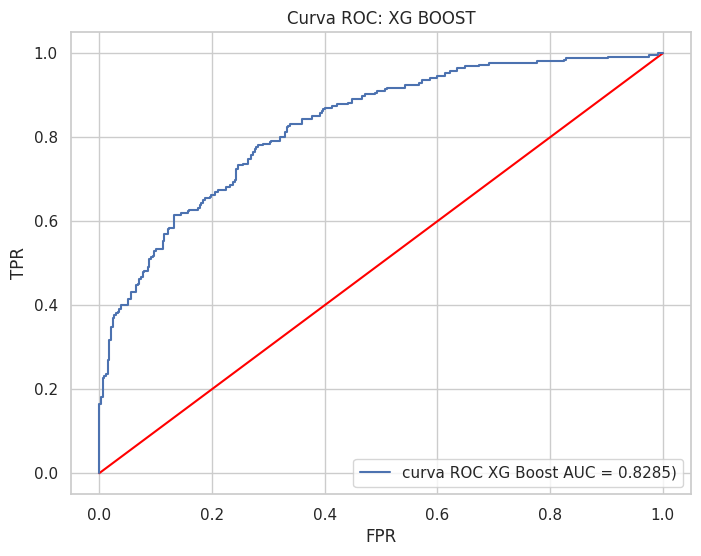

In [234]:
## Graficando nuestro curva ROC
auc_roc = roc_auc_score(y_test,y_proba_test)
fpr, tpr, thresholds = roc_curve(y_test,y_proba_test)
plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
plt.plot(fpr,fpr,color='red')
plt.plot(fpr,tpr,label=(f'curva ROC XG Boost AUC = {auc_roc:.4f})'))
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Curva ROC: XG BOOST')
plt.legend(loc = 'lower right')
plt.show()

### <font color='white'>⚪ **3.6.- LightGBM** </font>

In [235]:
model = LGBMClassifier(random_state=42)
model.fit(X_train_scaled, y_train)

[LightGBM] [Info] Number of positive: 825, number of negative: 950
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2053
[LightGBM] [Info] Number of data points in the train set: 1775, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.464789 -> initscore=-0.141079
[LightGBM] [Info] Start training from score -0.141079


LGBMClassifier(random_state=42)

In [236]:
# Predecir en el conjunto de prueba
y_pred = model.predict(X_test_scaled)

In [237]:
report = classification_report(y_test, y_pred, target_names=["No_Potable", "Potable"], output_dict=True)
pd.DataFrame(report).style.background_gradient()

,No_Potable,Potable,accuracy,macro avg,weighted avg
precision,0.798220,0.733333,0.770270,0.765776,0.770270
recall,0.798220,0.733333,0.770270,0.765776,0.770270
f1-score,0.798220,0.733333,0.770270,0.765776,0.770270
support,337.000000,255.000000,0.770270,592.000000,592.000000


In [ ]:
## Calculamos la predicción de probabilidad para nuestros datos de prueba, esto nos servirá para los calculos de AUC-ROC
y_proba_test = model.predict_proba(X_test_scaled)[:,1]

In [238]:
## En este caso, sabemos que la clase 1 - Potable
## Por ende procedemos a calcular las métricas para esta clase
accuracy = accuracy_score(y_test, y_pred)
precision = report['Potable']['precision']
recall = report['Potable']['recall']
f1 = report['Potable']['f1-score']
auc_roc = roc_auc_score(y_test,y_proba_test)
metricas_LightGBM = []
metricas_LightGBM.extend([accuracy,precision,recall,f1,auc_roc])
print('Accuracy:', accuracy)
print('Precision:',precision)
print('Recall:', recall)
print('F1-score:',f1)
print('AUC-ROC:',auc_roc)

Accuracy: 0.7702702702702703
Precision: 0.7333333333333333
Recall: 0.7333333333333333
F1-score: 0.7333333333333333
AUC-ROC: 0.8285215569907489


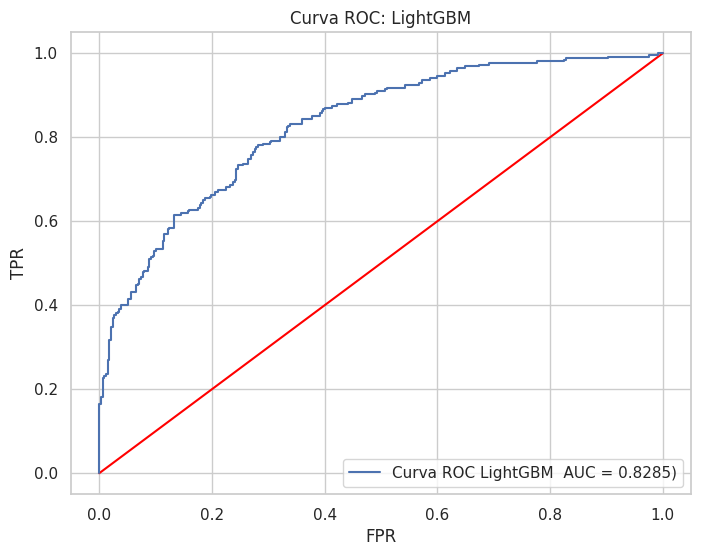

In [239]:
## Graficando nuestro curva ROC
auc_roc = roc_auc_score(y_test,y_proba_test)
fpr, tpr, thresholds = roc_curve(y_test,y_proba_test)
plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
plt.plot(fpr,fpr,color='red')
plt.plot(fpr,tpr,label=(f'Curva ROC LightGBM  AUC = {auc_roc:.4f})'))
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Curva ROC: LightGBM')
plt.legend(loc = 'lower right')
plt.show()

## <font color='orange'>🟠 **4. Agrupando Métricas - Comparando los modelos** </font>

In [240]:
modelos = ['Regresión Logística', 'Árbol de Decisión', 'Random Forest', 'Naive Bayes', 'XG Boost', 'LightGBM']
metricas = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']

In [241]:
## Creando el cuadro comparativo de métricas para nuestros modelos evaluados
comparativo_metricas = pd.DataFrame({
    'Métricas': metricas,
     modelos[0]: metricas_regresion_logistica,
     modelos[1]: metricas_arbol_decision,
     modelos[2]: metricas_random_forest,
     modelos[3]: metricas_naive_bayes,
     modelos[4]: metricas_XGboost,
     modelos[5]: metricas_LightGBM
})
comparativo_metricas.style.background_gradient()

,Métricas,Regresión Logística,Árbol de Decisión,Random Forest,Naive Bayes,XG Boost,LightGBM
0,Accuracy,0.591216,0.689189,0.770270,0.628378,0.731419,0.770270
1,Precision,0.537143,0.621993,0.738956,0.590674,0.684615,0.733333
2,Recall,0.368627,0.709804,0.721569,0.447059,0.698039,0.733333
3,F1-Score,0.437209,0.663004,0.730159,0.508929,0.691262,0.733333
4,AUC,0.591377,0.691697,0.833421,0.658940,0.828522,0.828522


In [242]:
## Cambiamos de un formato ancho a uno largo para poder graficar de mejor manera nuestros datos
comparativo_metricas.melt(id_vars='Métricas').style.background_gradient()

,Métricas,variable,value
0,Accuracy,Regresión Logística,0.591216
1,Precision,Regresión Logística,0.537143
2,Recall,Regresión Logística,0.368627
3,F1-Score,Regresión Logística,0.437209
4,AUC,Regresión Logística,0.591377
5,Accuracy,Árbol de Decisión,0.689189
6,Precision,Árbol de Decisión,0.621993
7,Recall,Árbol de Decisión,0.709804
8,F1-Score,Árbol de Decisión,0.663004
9,AUC,Árbol de Decisión,0.691697


## <font color='orange'>🟠 **5.Conclusiones de la Comparación** </font>

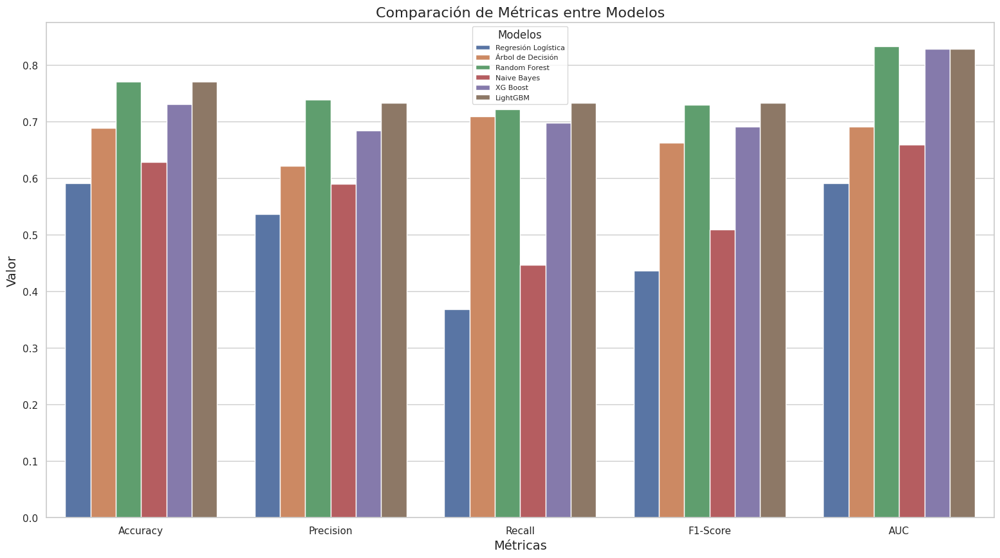

In [243]:
import matplotlib.pyplot as plt
import seaborn as sns

# Establecer un estilo de gráfico
sns.set(style="whitegrid")

# Crear el gráfico de barras
plt.figure(figsize=(19, 10))
sns.barplot(x='Métricas', y='value', hue='variable', data=comparativo_metricas.melt(id_vars='Métricas'))

# Añadir título y etiquetas a los ejes
plt.title('Comparación de Métricas entre Modelos', fontsize=16)
plt.xlabel('Métricas', fontsize=14)
plt.ylabel('Valor', fontsize=14)

# Añadir una leyenda con título
plt.legend(title='Modelos', fontsize=8)

# Mostrar el gráfico
plt.show()


>* **

* Realizamos la comparación de nuestros 6 modelos, **La regresión Logistica, El árbol de Decisión, Random Forest , Naive Bayes, XG Boost, LightGBM**. Aplicamos varias métricas para cada uno de nuestros modelos, entre las cuales tenemos: **Accuracy, Precision, Recall, F1Score y AUC la cual nos vamos a centrar en nuestra metrica AUC porque mis datos se encuentran desbalanceados**.


* Es importante tener en cuenta que estamos trabajando con **2 clases: 0-agua no potable y 1-agua potable**. Debido a esto separamos nuestro cuadro de clasificación de métricas para estas dos clases, a fin de visualizar de mejor manera los valores para las clases.


* Todas nuestras métricas mostradas en la gráfica son evaluadas para nuestra **clase 1-agua potable**, Lo que se busca es entender cómo el modelo está realizando predicciones específicamente para esa clase.




$$\text{Precisión} = \frac{\text{Verdaderos Positivos}}{\text{Verdaderos Positivos} + \text{Falsos Positivos}}$$

> * La **Precisión**, nos evalúa sobre nuestra predicción, esto nos dice que de todos los Verdaderos Positivos predichos que tantos son Verdaderos Positivos y que tantos nos salieron como Falsos positivos. Esto quiere decir que mientras más se acerque al valor de 1 nuestra métrica, nuestra predicción será más buena. Pero esto no exime de que algunos Positivos se vayan a nuestros Falsos negativos. Debido a esto no podemos quedarnos solo con esta métrica, si es importante a tener en cuenta pero no tiene que ser la única.


$$\text{Recall} = \frac{\text{Verdaderos Positivos}}{\text{Verdaderos Positivos} + \text{Falsos Negativos}}$$

> * El **Recall**, nos evalúa sobre nuestras muestras reales, esto nos dice que de todos nuestros datos reales Positivos que tantos son realmente Positivos y que tantos son Falsos Negativos. Esto quiere decir que mientras más se acerque el valor a 1, tendremos menos Falsos negativos y mejor predicción de los Reales Positivos, esto es benficioso porque si tenemos menos falsos Negativos, esto quiere decir que pocos verdaderos positivos se escapan de ser predichos como Positivos. Esta métrica nos ayuda mucho a saber que realmente nuestros datos positivos tengan prediccion positiva.


$$\text{F1-Score} = 2 \times \frac{\text{Precisión} \times \text{Recall}}{\text{Precisión} + \text{Recall}}$$

> * El **F1-Score**, esta métrica nos evalúa el promedio ponderado de la Precisión y del Recall. Esto es importante debido a que como observamos muchas veces ciertos modelos tienen más alta precisión que otros, pero en el Recall quedan relegados. Con esta métrica nos apoyamos de un aspecto estadístico para poder ponderar estos valores y deducir que modelo podría comportarse de mejor manera. Normalmente se considera mucho este valor en data desbalanceada como en nuestro caso.


$$\text{La fórmula del Área bajo la Curva ROC (AUC) es:}$$

$$AUC = \int_{0}^{1} \text{TPR} \, d\text{FPR}$$

\begin{align*}
\text{TPR} & : \text{Tasa de Verdaderos Positivos (Sensibilidad o Recall)}, \\
\text{FPR} & : \text{Tasa de Falsos Positivos}.
\end{align*}


> * Como última Métrica a Analizar, y también una de las más importantes es el **AUC**, el cual nos mide la **comparación** entre la **Tasa de Verdaderos Positivos y los Falsos Positivos**. Es importante tener en cuenta que lo que queremos es conseguir mayor número de verdaderos Positivos ya que queremos conseguir predecir a nuestra clase 0-Good customer. Por esta razón, mientras más alto sea el valor de AUC, esto nos indica que tendremos mayor cantidad de verdaderos Positivos con menos cantidad de Falsos Positivos.


> * En nuestro análisis, encontramos que tanto LightGBM como Random Forest tienen un buen rendimiento en términos de AUC, siendo Random Forest el ganador con un 83.3%. A pesar de esta ligera ventaja, vamos a automatizar ambos modelos usando GridSearchCV para ver cómo se comportan, ya que la diferencia en AUC entre los dos modelos es mínima, de alrededor del 1%.

Finalmente, luego de analizar todas nuestras métricas que consideramos importantes para nuestra predicción, y sabiendo que lo que queremos conseguir es predecir de mejor manera nuestra clase 1, teniendo la menor cantidad de Falsos positivos y Falsos Negativos, concluimos que: El modelo a elegir es el **Light GBM** y **Random Forest**, pero después de la automatización me voy a quedar con uno.
>* **

## <font color='orange'>🟠 **6. Optimizando nuestro modelo con Hiperparámetros (Random Forest)** </font> <font color='orange'>

In [ ]:
param_grid = {
    'n_estimators': [100, 200,300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [ ]:
model = RandomForestClassifier(random_state=42)

In [ ]:
# Crear el objeto GridSearchCV
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='f1')
grid_search.fit(X_train_scaled, y_train)

# Obtener los mejores parámetros y el mejor score
best_params = grid_search.best_params_
print(f"Mejores hiperparámetros: {best_params}")

Mejores hiperparámetros: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


### <font color='white'>⚪ **6.1.- Random Forest - Optimizado** </font>

In [ ]:
## Entrenando el modelo
model = RandomForestClassifier(random_state=42, n_estimators=200, max_depth=20, min_samples_leaf= 1, min_samples_split=2)
model.fit(X_train_scaled, y_train)

RandomForestClassifier(max_depth=20, n_estimators=200, random_state=42)

In [ ]:
y_pred = model.predict(X_test_scaled)

In [ ]:
report = classification_report(y_test, y_pred, target_names=["No_Potable", "Potable"], output_dict=True)
pd.DataFrame(report).style.background_gradient()

,No_Potable,Potable,accuracy,macro avg,weighted avg
precision,0.804217,0.730769,0.771959,0.767493,0.772580
recall,0.792285,0.745098,0.771959,0.768691,0.771959
f1-score,0.798206,0.737864,0.771959,0.768035,0.772214
support,337.000000,255.000000,0.771959,592.000000,592.000000


In [ ]:
## Calculamos la predicción de probabilidad para nuestros datos de prueba, esto nos servirá para los calculos de AUC-ROC
y_proba_test = model.predict_proba(X_test_scaled)[:,1]

In [ ]:
## En este caso, sabemos que la clase 1 - Potable
## Por ende procedemos a calcular las métricas para esta clase
accuracy = accuracy_score(y_test, y_pred)
precision = report['Potable']['precision']
recall = report['Potable']['recall']
f1 = report['Potable']['f1-score']
auc_roc = roc_auc_score(y_test,y_proba_test)
metricas_random_forest = []
metricas_random_forest.extend([accuracy,precision,recall,f1,auc_roc])
print('Accuracy:', accuracy)
print('Precision:',precision)
print('Recall:', recall)
print('F1-score:',f1)
print('AUC-ROC:',auc_roc)

Accuracy: 0.7719594594594594
Precision: 0.7307692307692307
Recall: 0.7450980392156863
F1-score: 0.7378640776699028
AUC-ROC: 0.8375981846744632


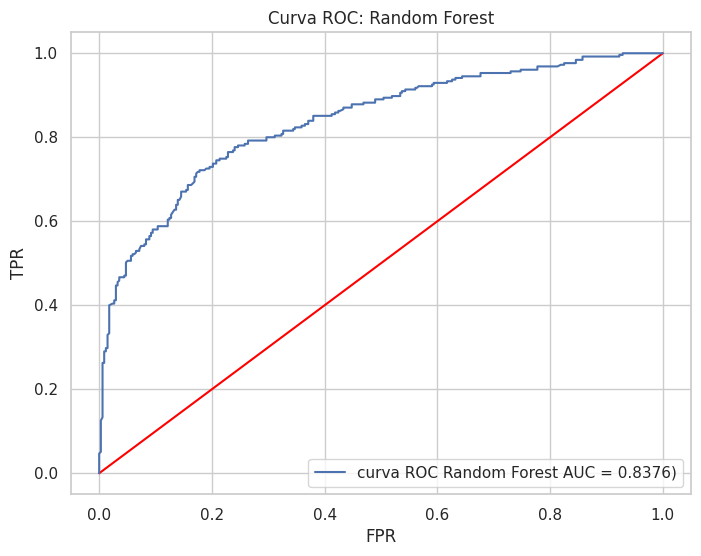

In [ ]:
## Graficando nuestro curva ROC
auc_roc = roc_auc_score(y_test,y_proba_test)
fpr, tpr, thresholds = roc_curve(y_test,y_proba_test)
plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
plt.plot(fpr,fpr,color='red')
plt.plot(fpr,tpr,label=(f'curva ROC Random Forest AUC = {auc_roc:.4f})'))
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Curva ROC: Random Forest')
plt.legend(loc = 'lower right')

## <font color='orange'>🟠 **7. Optimizando nuestro modelo con Hiperparámetros (LightGBM)** </font> <font color='orange'>

In [412]:
param_grid = {
    'n_estimators': [200, 300, 400, 500, 600],
}

In [413]:
model = LGBMClassifier(random_state=42)

In [256]:
# Crear el objeto GridSearchCV
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='f1')
grid_search.fit(X_train_scaled, y_train)

# Obtener los mejores parámetros y el mejor score
best_params = grid_search.best_params_
print(f"Mejores hiperparámetros: {best_params}")

[LightGBM] [Info] Number of positive: 550, number of negative: 633
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2053
[LightGBM] [Info] Number of data points in the train set: 1183, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.464920 -> initscore=-0.140552
[LightGBM] [Info] Start training from score -0.140552
[LightGBM] [Info] Number of positive: 550, number of negative: 633
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2053
[LightGBM] [Info] Number of data points in the train set: 1183, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.464920 -> initscore=-0.140552
[LightGBM] [Info] Start training from score -0.140552
[LightGBM] [Info] Number

### <font color='white'>⚪ **7.1.- LightGBM - Optimizado** </font>

In [414]:
model = LGBMClassifier( random_state=42, n_estimators=300)
model.fit(X_train_scaled, y_train)

[LightGBM] [Info] Number of positive: 825, number of negative: 950
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2053
[LightGBM] [Info] Number of data points in the train set: 1775, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.464789 -> initscore=-0.141079
[LightGBM] [Info] Start training from score -0.141079


LGBMClassifier(n_estimators=300, random_state=42)

In [415]:
# Predecir en el conjunto de prueba
y_pred = model.predict(X_test_scaled)

In [416]:
report = classification_report(y_test, y_pred, target_names=["No_Potable", "Potable"], output_dict=True)
pd.DataFrame(report).style.background_gradient()

,No_Potable,Potable,accuracy,macro avg,weighted avg
precision,0.804217,0.730769,0.771959,0.767493,0.772580
recall,0.792285,0.745098,0.771959,0.768691,0.771959
f1-score,0.798206,0.737864,0.771959,0.768035,0.772214
support,337.000000,255.000000,0.771959,592.000000,592.000000


In [417]:
## Calculamos la predicción de probabilidad para nuestros datos de prueba, esto nos servirá para los calculos de AUC-ROC
y_proba_test = model.predict_proba(X_test_scaled)[:,1]

In [418]:
## En este caso, sabemos que la clase 1 - Potable
## Por ende procedemos a calcular las métricas para esta clase
accuracy = accuracy_score(y_test, y_pred)
precision = report['Potable']['precision']
recall = report['Potable']['recall']
f1 = report['Potable']['f1-score']
auc_roc = roc_auc_score(y_test,y_proba_test)
metricas_LightGBM = []
metricas_LightGBM.extend([accuracy,precision,recall,f1,auc_roc])
print('Accuracy:', accuracy)
print('Precision:',precision)
print('Recall:', recall)
print('F1-score:',f1)
print('AUC-ROC:',auc_roc)

Accuracy: 0.7719594594594594
Precision: 0.7307692307692307
Recall: 0.7450980392156863
F1-score: 0.7378640776699028
AUC-ROC: 0.8533310059929017


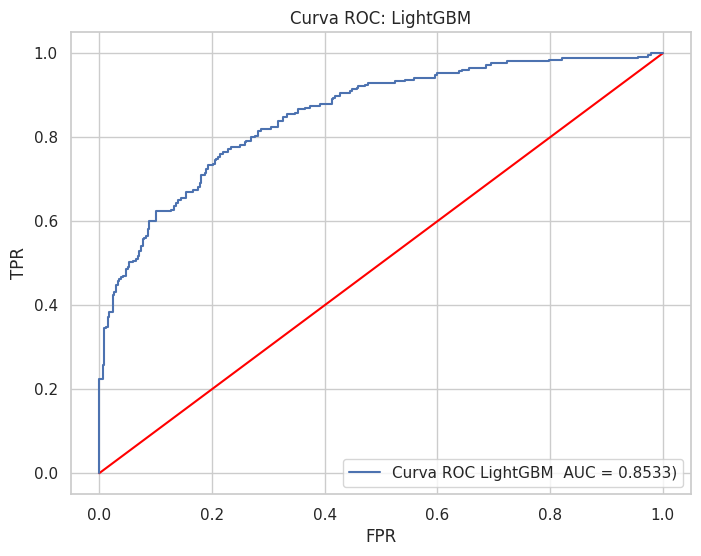

In [419]:
## Graficando nuestro curva ROC
auc_roc = roc_auc_score(y_test,y_proba_test)
fpr, tpr, thresholds = roc_curve(y_test,y_proba_test)
plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
plt.plot(fpr,fpr,color='red')
plt.plot(fpr,tpr,label=(f'Curva ROC LightGBM  AUC = {auc_roc:.4f})'))
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Curva ROC: LightGBM')
plt.legend(loc = 'lower right')
plt.show()

>* **Conclusión:**

**Después de optimizar los modelos usando Grid Search nos quedamos con el modelo LightGBM**

**Se logró mejorar la métrica AUC-ROC a 85.33%, lo que indica un buen rendimiento del modelo en términos de discriminación entre clases. Esta métrica es especialmente útil para evaluar modelos en problemas de clasificación binaria como la calidad del agua subterránea, donde es crucial identificar correctamente las muestras positivas (agua de calidad inaceptable).**

**La métrica AUC-ROC se basa en la tasa de verdaderos positivos (recall) y la tasa de falsos positivos. En este caso, un valor de 0.851 sugiere que el modelo es capaz de clasificar correctamente el 85.33% de los casos positivos (agua de buena calidad). Esto indica una buena capacidad del modelo para distinguir entre las dos clases.**

**Además, se seleccionó el modelo LGBMClassifier como el mejor para predecir la calidad del agua subterránea, lo que sugiere que este algoritmo es efectivo en este contexto. Esto podría atribuirse a su capacidad para manejar grandes conjuntos de datos y su eficiencia en términos de tiempo de procesamiento.**

**En conclusión, con un modelo optimizado y una métrica AUC-ROC mejorada, se puede confiar en las predicciones del modelo LGBMClassifier para identificar la calidad del agua subterránea de manera efectiva, lo que puede ser fundamental para la toma de decisiones en la gestión y conservación de los recursos hídricos.**

## <font color='orange'>🟠 **8. Prueba con instancia** </font> <font color='orange'>

In [420]:
nuevaCaracteristica_aguaSub = [{
    'orgCuen': 1,
    'ph': 7,
    'dureza': 221,
    'soliToDis': 17240,
    'conductividad': 442,
    'carbono_O': 16,
    'sulfato': 322,
    'trihalometanos': 78,
    'turbidez': 4.7,
}]

In [421]:
nuevaCaracteristica_aguaSub = pd.DataFrame.from_dict(nuevaCaracteristica_aguaSub)
instance_x = scaler.transform(nuevaCaracteristica_aguaSub)

In [422]:
# Predecir con el modelo
variant = model.predict(instance_x)
variant_proba = model.predict_proba(instance_x)

In [423]:
# Obtener el porcentaje de efectividad y el valor predicho
porcentaje_efectividad = round(variant_proba[0][variant[0]] * 100, 2)
valor_predicho = "Buena" if variant[0] == 1 else "Mala"

# Imprimir el resultado
print(f"La calidad del agua subterránea es {valor_predicho} con un {porcentaje_efectividad}% de confianza.")

La calidad del agua subterránea es Buena con un 96.9% de confianza.


## <font color='orange'>🟠 **9. Conclusión Final** </font> <font color='orange'>

**Basándose en el análisis realizado con el modelo LightGBM, se concluye que la calidad del agua subterránea es buena, con un nivel de confianza del 96.9%. Este resultado respalda la efectividad del modelo para predecir la calidad del agua subterránea con precisión. Este hallazgo refuerza la confianza en la calidad y fiabilidad del modelo en la evaluación de la calidad del agua subterránea.**